In [1]:
from jax import config
config.update("jax_enable_x64", True)
import h5py
import numpy as np
import gc
import jax
import jax.numpy as jnp
from jax_cfd.base import boundaries, grids, pressure, finite_differences as fd
import jax_cfd.base as cfd
import jax_cfd.base.grids as grids
import jax_cfd.spectral as spectral
import xarray 
import xarray as xr
import dataclasses
import time

def load_variable_from_mat(mat_file_path, variable_name):
    """Efficiently load a single variable from a MATLAB v7.3 .mat file."""
    try:
        with h5py.File(mat_file_path, 'r') as f:
            if variable_name in f:
                return np.array(f[variable_name])
            else:
                print(f"Variable '{variable_name}' not found in file.")
                return None
    except Exception as e:
        print(f"Error loading .mat file: {e}")
        return None

# Path to your MATLAB v7.3 .mat file
mat_file_path = r"/storage/scratch1/1/bchoi73/maturevm_1e-6.mat"  # Update "data.mat" to your fil  # Replace with your .mat file path

# Load the .mat file
s = load_variable_from_mat(mat_file_path, 'intials')

V = s[1, :, :]  # First layer
U = s[0, :, :] 

u = np.stack([U,V],axis=-1)

import numpy as np

# ---------- CONFIG ----------
C2 = 1.0/12.0          # your coefficients
C4 = 1.0/288.0
ERROR_TARGETS = [0.10, 0.20, 0.30]    # pick QoI error levels you care about
N_SWEEP = np.array([128, 192, 256, 384, 512, 768, 1024, 1536, 2048])  # Δ = 6π/N
DO_SPECTRAL_CHECK = True              # also compute E vs R fit quality (R^2)

# ---------- INPUT CHECK ----------
assert 'u' in globals(), "Please load variable 'u' first (shape (nx,ny,2) or (nt,nx,ny,2))."
arr = u
if arr.ndim == 3 and arr.shape[-1] == 2:
    arr = arr[None, ...]  # (1, nx, ny, 2)
elif arr.ndim == 4 and arr.shape[-1] == 2:
    pass
else:
    raise ValueError("u must have shape (nx,ny,2) or (nt,nx,ny,2).")

nt, nx, ny, ncomp = arr.shape
assert ncomp == 2 and nx == ny, "Expect square 2D field with 2 components."

# ---------- FFT utilities ----------
L = 2.0*np.pi
dx = L/nx
kx = np.fft.fftfreq(nx, d=dx)*2*np.pi
ky = np.fft.fftfreq(ny, d=dx)*2*np.pi
kxg, kyg = np.meshgrid(kx, ky, indexing='ij')
ikx, iky = 1j*kxg, 1j*kyg
k2 = kxg**2 + kyg**2

def fft2(a):  return np.fft.fftn(a, axes=(0,1))
def ifft2(A): return np.fft.ifftn(A, axes=(0,1)).real

def gaussian_filter_fft(field, Delta):
    """Apply isotropic Gaussian with G(k)=exp(-(kΔ)^2/24)."""
    G = np.exp(-(k2 * (Delta**2) / 24.0))
    return ifft2(fft2(field) * G)

def grad(field):
    """∇field for scalar field -> (∂x, ∂y)."""
    F = fft2(field)
    return ifft2(ikx*F), ifft2(iky*F)

# ---------- Isotropic spectrum and moments (per snapshot) ----------
def iso_spectrum_2d(ux, uy):
    Ux = fft2(ux); Uy = fft2(uy)
    Eh = 0.5*(np.abs(Ux)**2 + np.abs(Uy)**2)/(nx*ny)**2
    kmag = np.sqrt(k2)
    k_shell = np.rint(kmag).astype(int)
    kmax = int(k_shell.max())
    E_shell = np.bincount(k_shell.ravel(), weights=Eh.ravel(), minlength=kmax+1).astype(float)
    ks = np.arange(kmax+1, dtype=float)
    return ks[1:], E_shell[1:]  # drop k=0

kappas = []
for it in range(nt):
    ux, uy = arr[it,:,:,0], arr[it,:,:,1]
    ks, Ek = iso_spectrum_2d(ux, uy)
    M2 = np.sum((ks**2)*Ek)
    M4 = np.sum((ks**4)*Ek)
    if M2 <= 0 or M4 <= 0: raise RuntimeError("Non-positive M2/M4; check data.")
    kappas.append(np.sqrt(M4/M2))
kappas = np.array(kappas)
kappa_med = float(np.median(kappas))
print(f"[INFO] kappa_* median={kappa_med:.3f}  (min={kappas.min():.3f}, max={kappas.max():.3f})")

# ---------- Main sweep over Δ ----------
Deltas = 2.0*np.pi / N_SWEEP.astype(float)
R_vals = (C4/C2)*(kappa_med**2)*(Deltas**2)    # a-priori NGM ratio

E_vals = []   # modeling error from exact τ vs NGM2 τ
for Delta in Deltas:
    # Filtered velocities
    Ux_bar_t = np.empty_like(arr[...,0])
    Uy_bar_t = np.empty_like(arr[...,1])
    for it in range(nt):
        Ux_bar_t[it] = gaussian_filter_fft(arr[it,:,:,0], Delta)
        Uy_bar_t[it] = gaussian_filter_fft(arr[it,:,:,1], Delta)

    # Exact filtered SGS stress τ_ij = overline(u_i u_j) - ubar_i ubar_j
    # Compute overline(u_i u_j):
    tau_exact_t = []  # store Frobenius norm per time
    tau_ngm2_t = []
    for it in range(nt):
        ux = arr[it,:,:,0]; uy = arr[it,:,:,1]
        ux_bar = Ux_bar_t[it];  uy_bar = Uy_bar_t[it]

        # overline(u_i u_j)
        uu_xx = gaussian_filter_fft(ux*ux, Delta)
        uu_xy = gaussian_filter_fft(ux*uy, Delta)
        uu_yy = gaussian_filter_fft(uy*uy, Delta)

        # τ^exact components
        t_xx = uu_xx - ux_bar*ux_bar
        t_xy = uu_xy - ux_bar*uy_bar
        t_yy = uu_yy - uy_bar*uy_bar

        # NGM2 using resolved (filtered) gradients
        ux_x, ux_y = grad(ux_bar)
        uy_x, uy_y = grad(uy_bar)
        # (∂k u_i)(∂k u_j): sum over k=x,y
        gxx = ux_x*ux_x + ux_y*ux_y
        gxy = ux_x*uy_x + ux_y*uy_y
        gyy = uy_x*uy_x + uy_y*uy_y

        t2_xx = C2*(Delta**2)*gxx
        t2_xy = C2*(Delta**2)*gxy
        t2_yy = C2*(Delta**2)*gyy

        # Frobenius/RMS norms (space average of componentwise squares)
        exact_norm = np.sqrt(np.mean(t_xx**2 + 2*t_xy**2 + t_yy**2))
        ngm2_norm  = np.sqrt(np.mean(t2_xx**2 + 2*t2_xy**2 + t2_yy**2))
        diff_norm  = np.sqrt(np.mean((t_xx-t2_xx)**2 + 2*(t_xy-t2_xy)**2 + (t_yy-t2_yy)**2))

        # store relative error ||τ_exact - τ_NGM2|| / ||τ_exact||
        tau_exact_t.append(exact_norm)
        tau_ngm2_t.append(diff_norm / (exact_norm + 1e-30))

    # time-aggregate (median is robust)
    E_vals.append(float(np.median(tau_ngm2_t)))

E_vals = np.array(E_vals)

# ---------- Fit E ≈ a * R (through origin) to map error->θ ----------
# slope a = (R·E)/(R·R)
num = float(np.dot(R_vals, E_vals))
den = float(np.dot(R_vals, R_vals)) + 1e-30
a = num/den
# R^2 for quality (origin-constrained): 1 - SSE/SST with mean forced to 0
SSE = float(np.sum((E_vals - a*R_vals)**2))
SST = float(np.sum(E_vals**2)) + 1e-30
R2 = 1.0 - SSE/SST

print("\n[MAP] Fitted relation  E(Δ) ≈ a * R(Δ)")
print(f" a = {a:.4f}   (R^2 = {R2:.3f})")

# θ for desired error targets: θ = E_target / a
print("\n[θ from targets]")
for Et in ERROR_TARGETS:
    theta = Et / max(a, 1e-30)
    print(f" target error {Et:.2f}  ->  θ ≈ {theta:.3f}")

# Also report empirical θ at actual crossings (interpolate E vs R)
def interp_theta_at_error(target):
    # monotonic in practice; do a simple linear interp in R-space
    order = np.argsort(R_vals)
    R_sorted = R_vals[order]; E_sorted = E_vals[order]
    # find first index where E >= target
    idx = np.searchsorted(E_sorted, target)
    if idx == 0:
        return R_sorted[0]
    if idx >= len(E_sorted):
        return R_sorted[-1]
    # linear interp between points
    w = (target - E_sorted[idx-1]) / (E_sorted[idx] - E_sorted[idx-1] + 1e-30)
    return (1-w)*R_sorted[idx-1] + w*R_sorted[idx]

print("\n[Empirical θ at crossing E(Δ)=target]")
for Et in ERROR_TARGETS:
    th_emp = interp_theta_at_error(Et)
    print(f" target error {Et:.2f}  ->  θ_emp ≈ {th_emp:.3f}")

# Convenience: print the Δ and N at those crossings
print("\n[Crossing Δ*, N* for each target]")
for Et in ERROR_TARGETS:
    th_emp = interp_theta_at_error(Et)
    # find Δ where R(Δ)=θ_emp (again interpolate)
    order = np.argsort(R_vals)
    R_sorted = R_vals[order]; D_sorted = Deltas[order]; N_sorted = N_SWEEP[order]
    idx = np.searchsorted(R_sorted, th_emp)
    if idx == 0:
        D_star, N_star = D_sorted[0], N_sorted[0]
    elif idx >= len(R_sorted):
        D_star, N_star = D_sorted[-1], N_sorted[-1]
    else:
        w = (th_emp - R_sorted[idx-1]) / (R_sorted[idx] - R_sorted[idx-1] + 1e-30)
        D_star = (1-w)*D_sorted[idx-1] + w*D_sorted[idx]
        N_star = (1-w)*N_sorted[idx-1] + w*N_sorted[idx]
    print(f" target {Et:.2f} -> Δ* ≈ {D_star:.4f},  N* ≈ {N_star:.1f}")


[INFO] kappa_* median=10.184  (min=10.184, max=10.184)

[MAP] Fitted relation  E(Δ) ≈ a * R(Δ)
 a = 0.8198   (R^2 = 0.956)

[θ from targets]
 target error 0.10  ->  θ ≈ 0.122
 target error 0.20  ->  θ ≈ 0.244
 target error 0.30  ->  θ ≈ 0.366

[Empirical θ at crossing E(Δ)=target]
 target error 0.10  ->  θ_emp ≈ 0.010
 target error 0.20  ->  θ_emp ≈ 0.010
 target error 0.30  ->  θ_emp ≈ 0.010

[Crossing Δ*, N* for each target]
 target 0.10 -> Δ* ≈ 0.0491,  N* ≈ 128.0
 target 0.20 -> Δ* ≈ 0.0491,  N* ≈ 128.0
 target 0.30 -> Δ* ≈ 0.0491,  N* ≈ 128.0


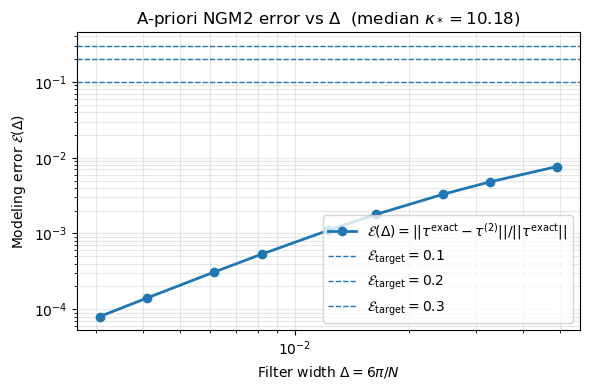

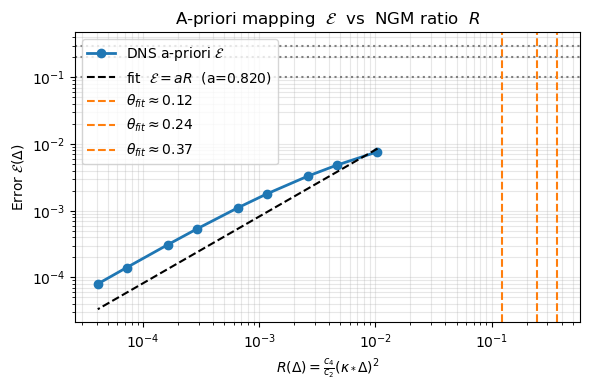


median κ*=10.18,  fitted slope a=0.820,  R²=0.956
 target 0.10 → θ_fit=0.122
 target 0.20 → θ_fit=0.244
 target 0.30 → θ_fit=0.366


In [2]:
# === Plot a-priori breakdown diagnostics ===
import matplotlib.pyplot as plt

# 1. Error vs Δ  (physical resolution space)
plt.figure(figsize=(6,4))
plt.plot(Deltas, E_vals, "o-", lw=2, label=r"$\mathcal{E}(\Delta)=||\tau^{\rm exact}-\tau^{(2)}||/||\tau^{\rm exact}||$")
plt.xlabel(r"Filter width $\Delta=6\pi/N$")
plt.ylabel(r"Modeling error $\mathcal{E}(\Delta)$")
plt.xscale("log"); plt.yscale("log")
plt.grid(True, which="both", alpha=0.3)
plt.title(fr"A-priori NGM2 error vs $\Delta$  (median $\kappa_*={kappa_med:.2f}$)")
for Et in ERROR_TARGETS:
    plt.axhline(Et, ls="--", lw=1, label=fr"$\mathcal{{E}}_\mathrm{{target}}={Et}$")
plt.legend()
plt.tight_layout()
plt.show()

# 2. Error vs R(Δ) (series small parameter)
plt.figure(figsize=(6,4))
plt.plot(R_vals, E_vals, "o-", lw=2, label=r"DNS a-priori $\mathcal{E}$")
plt.plot(R_vals, a*R_vals, "k--", lw=1.5, label=fr"fit  $\mathcal{{E}}=aR$  (a={a:.3f})")
for Et in ERROR_TARGETS:
    theta_est = Et / a
    plt.axhline(Et, color="gray", ls=":")
    plt.axvline(theta_est, color="C1", ls="--", label=fr"$\theta_{{fit}}\approx{theta_est:.2f}$")
plt.xlabel(r"$R(\Delta)=\frac{c_4}{c_2}(\kappa_*\Delta)^2$")
plt.ylabel(r"Error $\mathcal{E}(\Delta)$")
plt.xscale("log"); plt.yscale("log")
plt.grid(True, which="both", alpha=0.3)
plt.title("A-priori mapping  $\mathcal{E}$  vs  NGM ratio  $R$")
plt.legend()
plt.tight_layout()
plt.show()

# 3. Optional quick diagnostic text
print(f"\nmedian κ*={kappa_med:.2f},  fitted slope a={a:.3f},  R²={R2:.3f}")
for Et in ERROR_TARGETS:
    print(f" target {Et:.2f} → θ_fit={Et/a:.3f}")

[SWEEP] 50 points: N∈[5,512], Δ∈[1.227e-02,1.257e+00]

[MAP] E ≈ aR  -> a=0.0837, R²=0.893

[θ from targets]
 target 0.10  -> θ ≈ 1.194
 target 0.20  -> θ ≈ 2.388
 target 0.30  -> θ ≈ 3.583


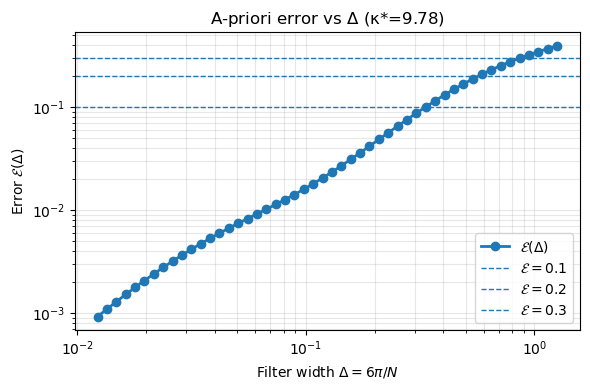

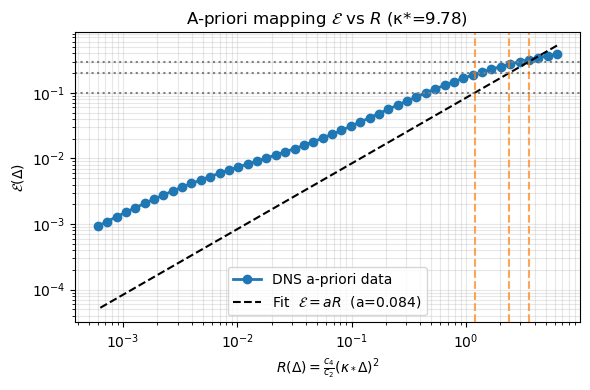

In [13]:
# ==============================================================
# Full A-PRIORI θ-analysis with log-spaced Δ-sweep (smooth plots)
# ==============================================================

import numpy as np
import matplotlib.pyplot as plt

C2, C4 = 1/12, 1/288
ERROR_TARGETS = [0.10, 0.20, 0.30]

# === log-spaced N grid for smoother Δ coverage ===
N_min, N_max, N_points = 5, 512, 50
N_SWEEP = np.geomspace(N_min, N_max, N_points)
Deltas = 2*np.pi / N_SWEEP
R_vals = (C4/C2)*(kappa_med**2)*(Deltas**2)

print(f"[SWEEP] {len(N_SWEEP)} points: N∈[{N_SWEEP.min():.0f},{N_SWEEP.max():.0f}], "
      f"Δ∈[{Deltas.min():.3e},{Deltas.max():.3e}]")

E_vals = []

for Delta in Deltas:
    # Filtered velocities
    Ux_bar_t = np.empty_like(arr[...,0])
    Uy_bar_t = np.empty_like(arr[...,1])
    for it in range(nt):
        Ux_bar_t[it] = gaussian_filter_fft(arr[it,:,:,0], Delta)
        Uy_bar_t[it] = gaussian_filter_fft(arr[it,:,:,1], Delta)

    # Compute SGS stresses
    tau_errs = []
    for it in range(nt):
        ux = arr[it,:,:,0]; uy = arr[it,:,:,1]
        ux_bar, uy_bar = Ux_bar_t[it], Uy_bar_t[it]

        uu_xx = gaussian_filter_fft(ux*ux, Delta)
        uu_xy = gaussian_filter_fft(ux*uy, Delta)
        uu_yy = gaussian_filter_fft(uy*uy, Delta)

        t_xx = uu_xx - ux_bar*ux_bar
        t_xy = uu_xy - ux_bar*uy_bar
        t_yy = uu_yy - uy_bar*uy_bar

        ux_x, ux_y = grad(ux_bar)
        uy_x, uy_y = grad(uy_bar)
        gxx = ux_x*ux_x + ux_y*ux_y
        gxy = ux_x*uy_x + ux_y*uy_y
        gyy = uy_x*uy_x + uy_y*uy_y

        t2_xx = C2*(Delta**2)*gxx
        t2_xy = C2*(Delta**2)*gxy
        t2_yy = C2*(Delta**2)*gyy

        exact_norm = np.sqrt(np.mean(t_xx**2 + 2*t_xy**2 + t_yy**2))
        diff_norm  = np.sqrt(np.mean((t_xx-t2_xx)**2 + 2*(t_xy-t2_xy)**2 + (t_yy-t2_yy)**2))
        tau_errs.append(diff_norm / (exact_norm + 1e-30))
    E_vals.append(np.median(tau_errs))

E_vals = np.array(E_vals)

# === Fit  E ≈ a R ===
a = float(np.dot(R_vals, E_vals) / (np.dot(R_vals, R_vals) + 1e-30))
R2 = 1 - np.sum((E_vals - a*R_vals)**2)/(np.sum(E_vals**2)+1e-30)
print(f"\n[MAP] E ≈ aR  -> a={a:.4f}, R²={R2:.3f}")

# === θ from chosen error targets ===
print("\n[θ from targets]")
for Et in ERROR_TARGETS:
    theta = Et / max(a, 1e-30)
    print(f" target {Et:.2f}  -> θ ≈ {theta:.3f}")

# === Plots ===
plt.figure(figsize=(6,4))
plt.plot(Deltas, E_vals, 'o-', lw=2, label=r"$\mathcal{E}(\Delta)$")
for Et in ERROR_TARGETS:
    plt.axhline(Et, ls="--", lw=1, label=fr"$\mathcal{{E}}={Et}$")
plt.xscale("log"); plt.yscale("log")
plt.xlabel(r"Filter width $\Delta=6\pi/N$")
plt.ylabel(r"Error $\mathcal{E}(\Delta)$")
plt.title(fr"A-priori error vs $\Delta$ (κ*={kappa_med:.2f})")
plt.grid(True, which="both", alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.plot(R_vals, E_vals, 'o-', lw=2, label="DNS a-priori data")
plt.plot(R_vals, a*R_vals, 'k--', lw=1.5, label=fr"Fit  $\mathcal{{E}}=aR$  (a={a:.3f})")
for Et in ERROR_TARGETS:
    θ_fit = Et/a
    plt.axvline(θ_fit, color="C1", ls="--", alpha=0.7)
    plt.axhline(Et, color="gray", ls=":")
plt.xscale("log"); plt.yscale("log")
plt.xlabel(r"$R(\Delta)=\frac{c_4}{c_2}(\kappa_*\Delta)^2$")
plt.ylabel(r"$\mathcal{E}(\Delta)$")
plt.title(fr"A-priori mapping $\mathcal{{E}}$ vs $R$ (κ*={kappa_med:.2f})")
plt.grid(True, which="both", alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

[INFO] κ* (from spectrum) = 9.778

[Crossings of measured R_direct(Δ) with θ]
[debug] θ=0.1: (Δ0,R0)=(0.341864, 0.096471), (Δ1,R1)=(0.361357, 0.1039)
  θ=0.10: Δ*≈0.3512,  N*≈17.9
[debug] θ=0.3: (Δ0,R0)=(1.223909, 0.29194), (Δ1,R1)=(1.293694, 0.303214)
  θ=0.30: Δ*≈1.2737,  N*≈4.9
[debug] θ=1.0: not reached
  θ=1.00: not reached in sweep.


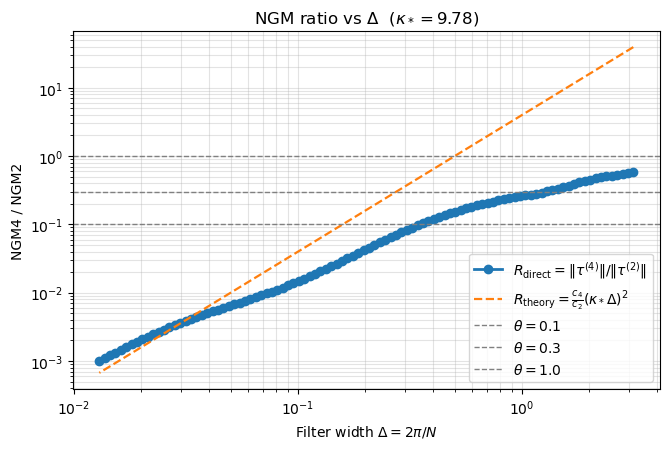

In [12]:
# ===================== NGM4 / NGM2 ratio — robust crossings (Δ = 2π/N) =====================
from jax import config
config.update("jax_enable_x64", True)

import h5py, gc, time
import numpy as np
import jax
import jax.numpy as jnp
import xarray as xr
import matplotlib.pyplot as plt

# --------------------- I/O: load .mat (v7.3, HDF5) -------------------------
def load_variable_from_mat(mat_file_path, variable_name):
    """Load a single variable from a MATLAB v7.3 .mat file (HDF5)."""
    try:
        with h5py.File(mat_file_path, 'r') as f:
            if variable_name in f:
                return np.array(f[variable_name])
            else:
                print(f"[WARN] Variable '{variable_name}' not found. Top-level keys: {list(f.keys())}")
                return None
    except Exception as e:
        print(f"[ERROR] {e}")
        return None

# ---- path + variable name (edit if needed) ----
mat_file_path = r"/storage/scratch1/1/bchoi73/maturevm_1e-5.mat"
var_name      = "intials"  # as in your snippet

s = load_variable_from_mat(mat_file_path, var_name)
assert s is not None, "Failed to load the variable from .mat"
# Expect s has shape (2, nx, ny): [U, V]
V = s[1, :, :]
U = s[0, :, :]
u = np.stack([U, V], axis=-1)            # (nx, ny, 2)
arr = u[None, ...]                       # (1, nx, ny, 2) for time-loop convenience
gc.collect()

# --------------------- constants & config -----------------------------------
C2, C4 = 1.0/12.0, 1.0/288.0
THETAS = [0.1, 0.3, 1.0]                 # tolerance lines for breakdown
SAVE_FIG = False
FIG_PATH = "ngm_ratio_vs_delta.png"

# Δ sweep: Δ = 2π/N. We avoid landing exactly on Δ=π by using endpoint=False
N_min, N_max, N_points = 2, 512, 100     # N≥2; adjust as desired
N_SWEEP = np.geomspace(N_min, N_max, N_points, endpoint=False)
Deltas  = 2.0*np.pi / N_SWEEP

# --------------------- FFT utilities on 2π×2π box --------------------------
nt, nx, ny, ncomp = arr.shape
assert ncomp == 2 and nx == ny, "Expect square grid and 2 velocity components."
L = 2.0*np.pi
dx = L / nx
dy = dx

kx = np.fft.fftfreq(nx, d=dx) * 2.0*np.pi
ky = np.fft.fftfreq(ny, d=dy) * 2.0*np.pi
kxg, kyg = np.meshgrid(kx, ky, indexing='ij')
ikx, iky = 1j*kxg, 1j*kyg
k2 = kxg**2 + kyg**2
kmag = np.sqrt(k2)

def fft2(a):  return np.fft.fftn(a, axes=(0,1))
def ifft2(A): return np.fft.ifftn(A, axes=(0,1)).real

def gaussian_filter_fft(field, Delta):
    """Isotropic Gaussian: G(k)=exp(-(kΔ)^2/24)."""
    G = np.exp(-(k2 * (Delta**2) / 24.0))
    return ifft2(fft2(field) * G)

def grad(field):
    """∇field for scalar field -> (∂x, ∂y) via FFT."""
    F = fft2(field)
    return ifft2(ikx*F), ifft2(iky*F)

def hessian_2d(field):
    """(f_xx, f_xy, f_yx, f_yy) via FFT (note: f_xy=f_yx)."""
    F = fft2(field)
    f_xx = ifft2(-(kxg**2) * F)
    f_yy = ifft2(-(kyg**2) * F)
    f_xy = ifft2((ikx * iky) * F)
    return f_xx, f_xy, f_xy, f_yy

# --------------------- κ* from isotropic spectrum ---------------------------
def iso_spectrum_2d(ux, uy):
    Ux = fft2(ux); Uy = fft2(uy)
    # Energy density; normalization choice is consistent across shells
    Eh = 0.5*(np.abs(Ux)**2 + np.abs(Uy)**2) / (nx*ny)**2
    k_shell = np.rint(kmag).astype(int)
    kmax = int(k_shell.max())
    E_shell = np.bincount(k_shell.ravel(), weights=Eh.ravel(), minlength=kmax+1).astype(float)
    ks = np.arange(kmax+1, dtype=float)
    return ks[1:], E_shell[1:]  # drop k=0

ux0, uy0 = arr[0, :, :, 0], arr[0, :, :, 1]
ks, Ek = iso_spectrum_2d(ux0, uy0)
M2 = float(np.sum((ks**2) * Ek))
M4 = float(np.sum((ks**4) * Ek))
assert M2 > 0 and M4 > 0, "Spectrum moments must be positive."
kappa_med = float(np.sqrt(M4 / M2))
print(f"[INFO] κ* (from spectrum) = {kappa_med:.3f}")

# --------------------- main: NGM4/NGM2 ratio sweep --------------------------
R_direct = np.empty_like(Deltas)  # measured ratio
for i, Delta in enumerate(Deltas):
    # Filtered velocities per (pseudo) time
    Ux_bar_t = np.empty_like(arr[..., 0])
    Uy_bar_t = np.empty_like(arr[..., 1])
    for it in range(nt):
        Ux_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 0], Delta)
        Uy_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 1], Delta)

    ratios_t = []
    for it in range(nt):
        ux_b, uy_b = Ux_bar_t[it], Uy_bar_t[it]

        # --- NGM2: τ^{(2)}_{ij} = C2 Δ^2 (∂k u_i)(∂k u_j)
        ux_x, ux_y = grad(ux_b)
        uy_x, uy_y = grad(uy_b)
        Gxx = ux_x*ux_x + ux_y*ux_y
        Gxy = ux_x*uy_x + ux_y*uy_y
        Gyy = uy_x*uy_x + uy_y*uy_y
        t2_xx = C2 * (Delta**2) * Gxx
        t2_xy = C2 * (Delta**2) * Gxy
        t2_yy = C2 * (Delta**2) * Gyy

        # --- NGM4: τ^{(4)}_{ij} = C4 Δ^4 (∂k∂ℓ u_i)(∂k∂ℓ u_j)
        uxx_xx, uxx_xy, uxx_yx, uxx_yy = hessian_2d(ux_b)
        uyy_xx, uyy_xy, uyy_yx, uyy_yy = hessian_2d(uy_b)
        HxHx = (uxx_xx**2 + 2*uxx_xy**2 + uxx_yy**2)                       # i=j=x
        HyHy = (uyy_xx**2 + 2*uyy_xy**2 + uyy_yy**2)                       # i=j=y
        HxHy = (uxx_xx*uyy_xx + 2*uxx_xy*uyy_xy + uxx_yy*uyy_yy)           # i=x, j=y
        t4_xx = C4 * (Delta**4) * HxHx
        t4_xy = C4 * (Delta**4) * HxHy
        t4_yy = C4 * (Delta**4) * HyHy

        # Frobenius norms and ratio
        n2 = np.sqrt(np.mean(t2_xx**2 + 2*t2_xy**2 + t2_yy**2))
        n4 = np.sqrt(np.mean(t4_xx**2 + 2*t4_xy**2 + t4_yy**2))
        ratios_t.append(n4 / (n2 + 1e-30))

    R_direct[i] = float(np.median(ratios_t))

# Theory curve from moments:
R_theory = (C4/C2) * (kappa_med**2) * (Deltas**2)

# --------------------- robust first-crossing utilities ----------------------
def first_cross_loglog(x, y, level):
    """
    First x where y(x) >= level using:
      • sorting by x
      • monotone non-decreasing envelope in y
      • log–log linear interpolation between bracketing points
    Returns Δ* or None.
    """
    x = np.asarray(x); y = np.asarray(y)
    m = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)
    x, y = x[m], y[m]
    order = np.argsort(x)
    x, y = x[order], y[order]
    y_env = np.maximum.accumulate(y)

    if not (y_env[0] <= level <= y_env[-1]):
        return None

    j = np.argmax(y_env >= level)
    if j == 0:
        return x[0]
    x0, x1 = x[j-1], x[j]
    y0, y1 = y_env[j-1], y_env[j]
    t = (np.log(level) - np.log(y0)) / (np.log(y1) - np.log(y0) + 1e-30)
    return np.exp((1.0 - t)*np.log(x0) + t*np.log(x1))

def bracket_debug(x, y, level):
    """Print the two points that bracket the crossing level (after envelope)."""
    x = np.asarray(x); y = np.asarray(y)
    order = np.argsort(x)
    x, y = x[order], y[order]
    y_env = np.maximum.accumulate(y)
    if y_env[-1] < level:
        print(f"[debug] θ={level}: not reached")
        return
    j = np.argmax(y_env >= level)
    if j == 0:
        print(f"[debug] θ={level}: crossed at first point Δ={x[0]:.6f}, R={y_env[0]:.6g}")
        return
    print(f"[debug] θ={level}: (Δ0,R0)=({x[j-1]:.6f}, {y_env[j-1]:.6g}), (Δ1,R1)=({x[j]:.6f}, {y_env[j]:.6g})")

# --------------------- crossings --------------------------
print("\n[Crossings of measured R_direct(Δ) with θ]")
for th in THETAS:
    bracket_debug(Deltas, R_direct, th)
    Dstar = first_cross_loglog(Deltas, R_direct, th)
    if Dstar is None:
        print(f"  θ={th:.2f}: not reached in sweep.")
    else:
        Nstar = 2.0*np.pi / Dstar          # correct conversion for Δ = 2π/N
        print(f"  θ={th:.2f}: Δ*≈{Dstar:.4f},  N*≈{Nstar:.1f}")

# --------------------- sanity checks (optional) -----------------------------
# R_direct should be ~increasing vs Δ after the envelope; this flags strong anomalies.
# (Tiny non-monotonicity is handled by y_env, so we don't assert strict monotonicity.)
assert np.all(np.isfinite(R_direct)), "Non-finite values in R_direct."
assert np.all(Deltas > 0), "Non-positive Δ encountered."

# --------------------- plot --------------------------
plt.figure(figsize=(6.8,4.6))
plt.plot(Deltas, R_direct, 'o-', lw=2, label=r'$R_{\rm direct}=\|\tau^{(4)}\|/\|\tau^{(2)}\|$')
plt.plot(Deltas, R_theory, '--', lw=1.6, label=rf'$R_{{\rm theory}}=\frac{{c_4}}{{c_2}}(\kappa_*\Delta)^2$')
for th in THETAS:
    plt.axhline(th, ls='--', lw=1, color='gray', label=fr'$\theta={th}$')
plt.xscale('log'); plt.yscale('log')
plt.xlabel(r'Filter width $\Delta = 2\pi/N$')
plt.ylabel(r'NGM4 / NGM2')
plt.title(fr'NGM ratio vs $\Delta$  ($\kappa_*={kappa_med:.2f}$)')
plt.grid(True, which='both', alpha=0.35)
plt.legend()
plt.tight_layout()
if SAVE_FIG:
    plt.savefig(FIG_PATH, dpi=180)
plt.show()
# ===========================================================================



[INFO] κ* (from spectrum) = 25.098

[Crossings of measured R_direct(Δ) with θ]
[debug] θ=0.1: (Δ0,R0)=(0.112773, 0.09969), (Δ1,R1)=(0.119203, 0.104291)
  θ=0.10: Δ*≈0.1132,  N*≈55.5
[debug] θ=0.3: (Δ0,R0)=(2.516635, 0.28927), (Δ1,R1)=(2.660129, 0.317437)
  θ=0.30: Δ*≈2.5719,  N*≈2.4
[debug] θ=1.0: not reached
  θ=1.00: not reached in sweep.


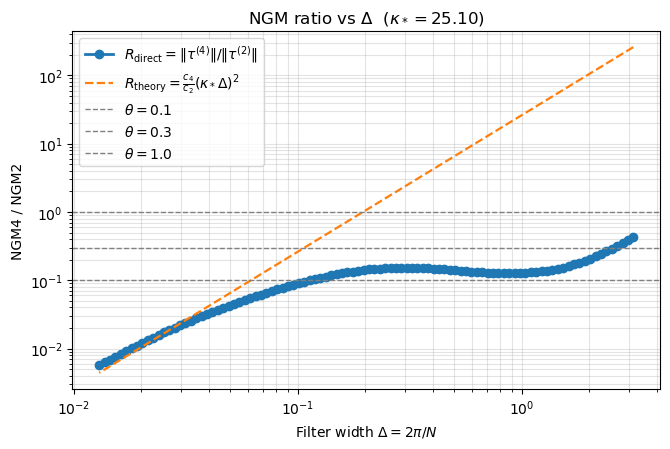

In [11]:
# ===================== NGM4 / NGM2 ratio — robust crossings (Δ = 2π/N) =====================
from jax import config
config.update("jax_enable_x64", True)

import h5py, gc, time
import numpy as np
import jax
import jax.numpy as jnp
import xarray as xr
import matplotlib.pyplot as plt

# --------------------- I/O: load .mat (v7.3, HDF5) -------------------------
def load_variable_from_mat(mat_file_path, variable_name):
    """Load a single variable from a MATLAB v7.3 .mat file (HDF5)."""
    try:
        with h5py.File(mat_file_path, 'r') as f:
            if variable_name in f:
                return np.array(f[variable_name])
            else:
                print(f"[WARN] Variable '{variable_name}' not found. Top-level keys: {list(f.keys())}")
                return None
    except Exception as e:
        print(f"[ERROR] {e}")
        return None

# ---- path + variable name (edit if needed) ----
mat_file_path = r"/storage/scratch1/1/bchoi73/filcoh_1e-5.mat"
var_name      = "intials"  # as in your snippet

s = load_variable_from_mat(mat_file_path, var_name)
assert s is not None, "Failed to load the variable from .mat"
# Expect s has shape (2, nx, ny): [U, V]
V = s[1, :, :]
U = s[0, :, :]
u = np.stack([U, V], axis=-1)            # (nx, ny, 2)
arr = u[None, ...]                       # (1, nx, ny, 2) for time-loop convenience
gc.collect()

# --------------------- constants & config -----------------------------------
C2, C4 = 1.0/12.0, 1.0/288.0
THETAS = [0.1, 0.3, 1.0]                 # tolerance lines for breakdown
SAVE_FIG = False
FIG_PATH = "ngm_ratio_vs_delta.png"

# Δ sweep: Δ = 2π/N. We avoid landing exactly on Δ=π by using endpoint=False
N_min, N_max, N_points = 2, 512, 100     # N≥2; adjust as desired
N_SWEEP = np.geomspace(N_min, N_max, N_points, endpoint=False)
Deltas  = 2.0*np.pi / N_SWEEP

# --------------------- FFT utilities on 2π×2π box --------------------------
nt, nx, ny, ncomp = arr.shape
assert ncomp == 2 and nx == ny, "Expect square grid and 2 velocity components."
L = 2.0*np.pi
dx = L / nx
dy = dx

kx = np.fft.fftfreq(nx, d=dx) * 2.0*np.pi
ky = np.fft.fftfreq(ny, d=dy) * 2.0*np.pi
kxg, kyg = np.meshgrid(kx, ky, indexing='ij')
ikx, iky = 1j*kxg, 1j*kyg
k2 = kxg**2 + kyg**2
kmag = np.sqrt(k2)

def fft2(a):  return np.fft.fftn(a, axes=(0,1))
def ifft2(A): return np.fft.ifftn(A, axes=(0,1)).real

def gaussian_filter_fft(field, Delta):
    """Isotropic Gaussian: G(k)=exp(-(kΔ)^2/24)."""
    G = np.exp(-(k2 * (Delta**2) / 24.0))
    return ifft2(fft2(field) * G)

def grad(field):
    """∇field for scalar field -> (∂x, ∂y) via FFT."""
    F = fft2(field)
    return ifft2(ikx*F), ifft2(iky*F)

def hessian_2d(field):
    """(f_xx, f_xy, f_yx, f_yy) via FFT (note: f_xy=f_yx)."""
    F = fft2(field)
    f_xx = ifft2(-(kxg**2) * F)
    f_yy = ifft2(-(kyg**2) * F)
    f_xy = ifft2((ikx * iky) * F)
    return f_xx, f_xy, f_xy, f_yy

# --------------------- κ* from isotropic spectrum ---------------------------
def iso_spectrum_2d(ux, uy):
    Ux = fft2(ux); Uy = fft2(uy)
    # Energy density; normalization choice is consistent across shells
    Eh = 0.5*(np.abs(Ux)**2 + np.abs(Uy)**2) / (nx*ny)**2
    k_shell = np.rint(kmag).astype(int)
    kmax = int(k_shell.max())
    E_shell = np.bincount(k_shell.ravel(), weights=Eh.ravel(), minlength=kmax+1).astype(float)
    ks = np.arange(kmax+1, dtype=float)
    return ks[1:], E_shell[1:]  # drop k=0

ux0, uy0 = arr[0, :, :, 0], arr[0, :, :, 1]
ks, Ek = iso_spectrum_2d(ux0, uy0)
M2 = float(np.sum((ks**2) * Ek))
M4 = float(np.sum((ks**4) * Ek))
assert M2 > 0 and M4 > 0, "Spectrum moments must be positive."
kappa_med = float(np.sqrt(M4 / M2))
print(f"[INFO] κ* (from spectrum) = {kappa_med:.3f}")

# --------------------- main: NGM4/NGM2 ratio sweep --------------------------
R_direct = np.empty_like(Deltas)  # measured ratio
for i, Delta in enumerate(Deltas):
    # Filtered velocities per (pseudo) time
    Ux_bar_t = np.empty_like(arr[..., 0])
    Uy_bar_t = np.empty_like(arr[..., 1])
    for it in range(nt):
        Ux_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 0], Delta)
        Uy_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 1], Delta)

    ratios_t = []
    for it in range(nt):
        ux_b, uy_b = Ux_bar_t[it], Uy_bar_t[it]

        # --- NGM2: τ^{(2)}_{ij} = C2 Δ^2 (∂k u_i)(∂k u_j)
        ux_x, ux_y = grad(ux_b)
        uy_x, uy_y = grad(uy_b)
        Gxx = ux_x*ux_x + ux_y*ux_y
        Gxy = ux_x*uy_x + ux_y*uy_y
        Gyy = uy_x*uy_x + uy_y*uy_y
        t2_xx = C2 * (Delta**2) * Gxx
        t2_xy = C2 * (Delta**2) * Gxy
        t2_yy = C2 * (Delta**2) * Gyy

        # --- NGM4: τ^{(4)}_{ij} = C4 Δ^4 (∂k∂ℓ u_i)(∂k∂ℓ u_j)
        uxx_xx, uxx_xy, uxx_yx, uxx_yy = hessian_2d(ux_b)
        uyy_xx, uyy_xy, uyy_yx, uyy_yy = hessian_2d(uy_b)
        HxHx = (uxx_xx**2 + 2*uxx_xy**2 + uxx_yy**2)                       # i=j=x
        HyHy = (uyy_xx**2 + 2*uyy_xy**2 + uyy_yy**2)                       # i=j=y
        HxHy = (uxx_xx*uyy_xx + 2*uxx_xy*uyy_xy + uxx_yy*uyy_yy)           # i=x, j=y
        t4_xx = C4 * (Delta**4) * HxHx
        t4_xy = C4 * (Delta**4) * HxHy
        t4_yy = C4 * (Delta**4) * HyHy

        # Frobenius norms and ratio
        n2 = np.sqrt(np.mean(t2_xx**2 + 2*t2_xy**2 + t2_yy**2))
        n4 = np.sqrt(np.mean(t4_xx**2 + 2*t4_xy**2 + t4_yy**2))
        ratios_t.append(n4 / (n2 + 1e-30))

    R_direct[i] = float(np.median(ratios_t))

# Theory curve from moments:
R_theory = (C4/C2) * (kappa_med**2) * (Deltas**2)

# --------------------- robust first-crossing utilities ----------------------
def first_cross_loglog(x, y, level):
    """
    First x where y(x) >= level using:
      • sorting by x
      • monotone non-decreasing envelope in y
      • log–log linear interpolation between bracketing points
    Returns Δ* or None.
    """
    x = np.asarray(x); y = np.asarray(y)
    m = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)
    x, y = x[m], y[m]
    order = np.argsort(x)
    x, y = x[order], y[order]
    y_env = np.maximum.accumulate(y)

    if not (y_env[0] <= level <= y_env[-1]):
        return None

    j = np.argmax(y_env >= level)
    if j == 0:
        return x[0]
    x0, x1 = x[j-1], x[j]
    y0, y1 = y_env[j-1], y_env[j]
    t = (np.log(level) - np.log(y0)) / (np.log(y1) - np.log(y0) + 1e-30)
    return np.exp((1.0 - t)*np.log(x0) + t*np.log(x1))

def bracket_debug(x, y, level):
    """Print the two points that bracket the crossing level (after envelope)."""
    x = np.asarray(x); y = np.asarray(y)
    order = np.argsort(x)
    x, y = x[order], y[order]
    y_env = np.maximum.accumulate(y)
    if y_env[-1] < level:
        print(f"[debug] θ={level}: not reached")
        return
    j = np.argmax(y_env >= level)
    if j == 0:
        print(f"[debug] θ={level}: crossed at first point Δ={x[0]:.6f}, R={y_env[0]:.6g}")
        return
    print(f"[debug] θ={level}: (Δ0,R0)=({x[j-1]:.6f}, {y_env[j-1]:.6g}), (Δ1,R1)=({x[j]:.6f}, {y_env[j]:.6g})")

# --------------------- crossings --------------------------
print("\n[Crossings of measured R_direct(Δ) with θ]")
for th in THETAS:
    bracket_debug(Deltas, R_direct, th)
    Dstar = first_cross_loglog(Deltas, R_direct, th)
    if Dstar is None:
        print(f"  θ={th:.2f}: not reached in sweep.")
    else:
        Nstar = 2.0*np.pi / Dstar          # correct conversion for Δ = 2π/N
        print(f"  θ={th:.2f}: Δ*≈{Dstar:.4f},  N*≈{Nstar:.1f}")

# --------------------- sanity checks (optional) -----------------------------
# R_direct should be ~increasing vs Δ after the envelope; this flags strong anomalies.
# (Tiny non-monotonicity is handled by y_env, so we don't assert strict monotonicity.)
assert np.all(np.isfinite(R_direct)), "Non-finite values in R_direct."
assert np.all(Deltas > 0), "Non-positive Δ encountered."

# --------------------- plot --------------------------
plt.figure(figsize=(6.8,4.6))
plt.plot(Deltas, R_direct, 'o-', lw=2, label=r'$R_{\rm direct}=\|\tau^{(4)}\|/\|\tau^{(2)}\|$')
plt.plot(Deltas, R_theory, '--', lw=1.6, label=rf'$R_{{\rm theory}}=\frac{{c_4}}{{c_2}}(\kappa_*\Delta)^2$')
for th in THETAS:
    plt.axhline(th, ls='--', lw=1, color='gray', label=fr'$\theta={th}$')
plt.xscale('log'); plt.yscale('log')
plt.xlabel(r'Filter width $\Delta = 2\pi/N$')
plt.ylabel(r'NGM4 / NGM2')
plt.title(fr'NGM ratio vs $\Delta$  ($\kappa_*={kappa_med:.2f}$)')
plt.grid(True, which='both', alpha=0.35)
plt.legend()
plt.tight_layout()
if SAVE_FIG:
    plt.savefig(FIG_PATH, dpi=180)
plt.show()
# ===========================================================================

[INFO] κ* (from spectrum) = 2.591

[Crossings of measured R_direct(Δ) with θ]
[debug] θ=0.1: (Δ0,R0)=(0.877515, 0.0996076), (Δ1,R1)=(0.927549, 0.106322)
  θ=0.10: Δ*≈0.8805,  N*≈7.1
[debug] θ=0.3: (Δ0,R0)=(2.252452, 0.296997), (Δ1,R1)=(2.380882, 0.316712)
  θ=0.30: Δ*≈2.2721,  N*≈2.8
[debug] θ=1.0: not reached
  θ=1.00: not reached in sweep.
[fit] alpha_hat ≈ 0.989  (expected ~1 if theory constants & norms match)

[Predicted Δ* from fitted α (stable)]
  θ=0.10: Δ*≈0.6012,  N*≈10.45
  θ=0.30: Δ*≈1.0414,  N*≈6.03
  θ=1.00: Δ*≈1.9013,  N*≈3.30

[Direct Δ* (first-crossing) vs Predicted Δ*]
  θ=0.10: direct=(0.8805), predicted=(0.6012)
  θ=0.30: direct=(2.2721), predicted=(1.0414)
  θ=1.00: direct=NR, predicted=(1.9013)


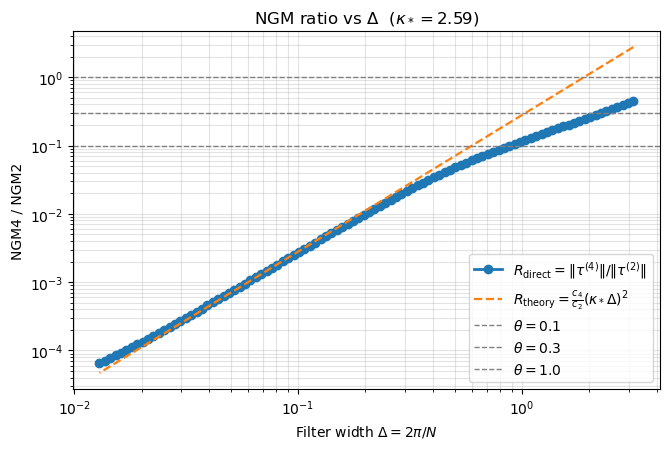

In [14]:
# ===================== NGM4 / NGM2 ratio — robust crossings (Δ = 2π/N) =====================
from jax import config
config.update("jax_enable_x64", True)

import h5py, gc, time
import numpy as np
import jax
import jax.numpy as jnp
import xarray as xr
import matplotlib.pyplot as plt

# --------------------- I/O: load .mat (v7.3, HDF5) -------------------------
def load_variable_from_mat(mat_file_path, variable_name):
    """Load a single variable from a MATLAB v7.3 .mat file (HDF5)."""
    try:
        with h5py.File(mat_file_path, 'r') as f:
            if variable_name in f:
                return np.array(f[variable_name])
            else:
                print(f"[WARN] Variable '{variable_name}' not found. Top-level keys: {list(f.keys())}")
                return None
    except Exception as e:
        print(f"[ERROR] {e}")
        return None

# ---- path + variable name (edit if needed) ----
mat_file_path = r"/storage/scratch1/1/bchoi73/condensate_1e-5.mat"
var_name      = "intials"  # as in your snippet

s = load_variable_from_mat(mat_file_path, var_name)
assert s is not None, "Failed to load the variable from .mat"
# Expect s has shape (2, nx, ny): [U, V]
V = s[1, :, :]
U = s[0, :, :]
u = np.stack([U, V], axis=-1)            # (nx, ny, 2)
arr = u[None, ...]                       # (1, nx, ny, 2) for time-loop convenience
gc.collect()

# --------------------- constants & config -----------------------------------
C2, C4 = 1.0/12.0, 1.0/288.0
THETAS = [0.1, 0.3, 1.0]                 # tolerance lines for breakdown
SAVE_FIG = False
FIG_PATH = "ngm_ratio_vs_delta.png"

# Δ sweep: Δ = 2π/N. We avoid landing exactly on Δ=π by using endpoint=False
N_min, N_max, N_points = 2, 512, 100     # N≥2; adjust as desired
N_SWEEP = np.geomspace(N_min, N_max, N_points, endpoint=False)
Deltas  = 2.0*np.pi / N_SWEEP

# --------------------- FFT utilities on 2π×2π box --------------------------
nt, nx, ny, ncomp = arr.shape
assert ncomp == 2 and nx == ny, "Expect square grid and 2 velocity components."
L = 2.0*np.pi
dx = L / nx
dy = dx

kx = np.fft.fftfreq(nx, d=dx) * 2.0*np.pi
ky = np.fft.fftfreq(ny, d=dy) * 2.0*np.pi
kxg, kyg = np.meshgrid(kx, ky, indexing='ij')
ikx, iky = 1j*kxg, 1j*kyg
k2 = kxg**2 + kyg**2
kmag = np.sqrt(k2)

def fft2(a):  return np.fft.fftn(a, axes=(0,1))
def ifft2(A): return np.fft.ifftn(A, axes=(0,1)).real

def gaussian_filter_fft(field, Delta):
    """Isotropic Gaussian: G(k)=exp(-(kΔ)^2/24)."""
    G = np.exp(-(k2 * (Delta**2) / 24.0))
    return ifft2(fft2(field) * G)

def grad(field):
    """∇field for scalar field -> (∂x, ∂y) via FFT."""
    F = fft2(field)
    return ifft2(ikx*F), ifft2(iky*F)

def hessian_2d(field):
    """(f_xx, f_xy, f_yx, f_yy) via FFT (note: f_xy=f_yx)."""
    F = fft2(field)
    f_xx = ifft2(-(kxg**2) * F)
    f_yy = ifft2(-(kyg**2) * F)
    f_xy = ifft2((ikx * iky) * F)
    return f_xx, f_xy, f_xy, f_yy

# --------------------- κ* from isotropic spectrum ---------------------------
def iso_spectrum_2d(ux, uy):
    Ux = fft2(ux); Uy = fft2(uy)
    # Energy density; normalization choice is consistent across shells
    Eh = 0.5*(np.abs(Ux)**2 + np.abs(Uy)**2) / (nx*ny)**2
    k_shell = np.rint(kmag).astype(int)
    kmax = int(k_shell.max())
    E_shell = np.bincount(k_shell.ravel(), weights=Eh.ravel(), minlength=kmax+1).astype(float)
    ks = np.arange(kmax+1, dtype=float)
    return ks[1:], E_shell[1:]  # drop k=0

ux0, uy0 = arr[0, :, :, 0], arr[0, :, :, 1]
ks, Ek = iso_spectrum_2d(ux0, uy0)
M2 = float(np.sum((ks**2) * Ek))
M4 = float(np.sum((ks**4) * Ek))
assert M2 > 0 and M4 > 0, "Spectrum moments must be positive."
kappa_med = float(np.sqrt(M4 / M2))
print(f"[INFO] κ* (from spectrum) = {kappa_med:.3f}")

# --------------------- main: NGM4/NGM2 ratio sweep --------------------------
R_direct = np.empty_like(Deltas)  # measured ratio
for i, Delta in enumerate(Deltas):
    # Filtered velocities per (pseudo) time
    Ux_bar_t = np.empty_like(arr[..., 0])
    Uy_bar_t = np.empty_like(arr[..., 1])
    for it in range(nt):
        Ux_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 0], Delta)
        Uy_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 1], Delta)

    ratios_t = []
    for it in range(nt):
        ux_b, uy_b = Ux_bar_t[it], Uy_bar_t[it]

        # --- NGM2: τ^{(2)}_{ij} = C2 Δ^2 (∂k u_i)(∂k u_j)
        ux_x, ux_y = grad(ux_b)
        uy_x, uy_y = grad(uy_b)
        Gxx = ux_x*ux_x + ux_y*ux_y
        Gxy = ux_x*uy_x + ux_y*uy_y
        Gyy = uy_x*uy_x + uy_y*uy_y
        t2_xx = C2 * (Delta**2) * Gxx
        t2_xy = C2 * (Delta**2) * Gxy
        t2_yy = C2 * (Delta**2) * Gyy

        # --- NGM4: τ^{(4)}_{ij} = C4 Δ^4 (∂k∂ℓ u_i)(∂k∂ℓ u_j)
        uxx_xx, uxx_xy, uxx_yx, uxx_yy = hessian_2d(ux_b)
        uyy_xx, uyy_xy, uyy_yx, uyy_yy = hessian_2d(uy_b)
        HxHx = (uxx_xx**2 + 2*uxx_xy**2 + uxx_yy**2)                       # i=j=x
        HyHy = (uyy_xx**2 + 2*uyy_xy**2 + uyy_yy**2)                       # i=j=y
        HxHy = (uxx_xx*uyy_xx + 2*uxx_xy*uyy_xy + uxx_yy*uyy_yy)           # i=x, j=y
        t4_xx = C4 * (Delta**4) * HxHx
        t4_xy = C4 * (Delta**4) * HxHy
        t4_yy = C4 * (Delta**4) * HyHy

        # Frobenius norms and ratio
        n2 = np.sqrt(np.mean(t2_xx**2 + 2*t2_xy**2 + t2_yy**2))
        n4 = np.sqrt(np.mean(t4_xx**2 + 2*t4_xy**2 + t4_yy**2))
        ratios_t.append(n4 / (n2 + 1e-30))

    R_direct[i] = float(np.median(ratios_t))

# Theory curve from moments:
R_theory = (C4/C2) * (kappa_med**2) * (Deltas**2)

# --------------------- robust first-crossing utilities ----------------------
def first_cross_loglog(x, y, level):
    """
    First x where y(x) >= level using:
      • sorting by x
      • monotone non-decreasing envelope in y
      • log–log linear interpolation between bracketing points
    Returns Δ* or None.
    """
    x = np.asarray(x); y = np.asarray(y)
    m = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)
    x, y = x[m], y[m]
    order = np.argsort(x)
    x, y = x[order], y[order]
    y_env = np.maximum.accumulate(y)

    if not (y_env[0] <= level <= y_env[-1]):
        return None

    j = np.argmax(y_env >= level)
    if j == 0:
        return x[0]
    x0, x1 = x[j-1], x[j]
    y0, y1 = y_env[j-1], y_env[j]
    t = (np.log(level) - np.log(y0)) / (np.log(y1) - np.log(y0) + 1e-30)
    return np.exp((1.0 - t)*np.log(x0) + t*np.log(x1))

def bracket_debug(x, y, level):
    """Print the two points that bracket the crossing level (after envelope)."""
    x = np.asarray(x); y = np.asarray(y)
    order = np.argsort(x)
    x, y = x[order], y[order]
    y_env = np.maximum.accumulate(y)
    if y_env[-1] < level:
        print(f"[debug] θ={level}: not reached")
        return
    j = np.argmax(y_env >= level)
    if j == 0:
        print(f"[debug] θ={level}: crossed at first point Δ={x[0]:.6f}, R={y_env[0]:.6g}")
        return
    print(f"[debug] θ={level}: (Δ0,R0)=({x[j-1]:.6f}, {y_env[j-1]:.6g}), (Δ1,R1)=({x[j]:.6f}, {y_env[j]:.6g})")

# --------------------- crossings --------------------------
print("\n[Crossings of measured R_direct(Δ) with θ]")
for th in THETAS:
    bracket_debug(Deltas, R_direct, th)
    Dstar = first_cross_loglog(Deltas, R_direct, th)
    if Dstar is None:
        print(f"  θ={th:.2f}: not reached in sweep.")
    else:
        Nstar = 2.0*np.pi / Dstar          # correct conversion for Δ = 2π/N
        print(f"  θ={th:.2f}: Δ*≈{Dstar:.4f},  N*≈{Nstar:.1f}")

# --------------------- sanity checks (optional) -----------------------------
# R_direct should be ~increasing vs Δ after the envelope; this flags strong anomalies.
# (Tiny non-monotonicity is handled by y_env, so we don't assert strict monotonicity.)
assert np.all(np.isfinite(R_direct)), "Non-finite values in R_direct."
assert np.all(Deltas > 0), "Non-positive Δ encountered."
# ===== Diagnostics: local slope and power-law window =====
def finite_log_slope(x, y):
    """s_i = d log y / d log x with central diffs on log-log axes."""
    lx, ly = np.log(x), np.log(y)
    s = np.empty_like(y)
    s[0]  = (ly[1]-ly[0])/(lx[1]-lx[0]+1e-30)
    s[-1] = (ly[-1]-ly[-2])/(lx[-1]-lx[-2]+1e-30)
    s[1:-1] = (ly[2:]-ly[:-2])/(lx[2:]-lx[:-2]+1e-30)
    return s

slope = finite_log_slope(Deltas, R_direct)

# Choose a region where the empirical slope is ~2
SLOPE_LO, SLOPE_HI = 1.7, 2.3
mask_pw = (slope > SLOPE_LO) & (slope < SLOPE_HI) & np.isfinite(R_direct) & (R_direct>0)
if mask_pw.sum() < 5:
    # Fallback: take the middle 30% of Δ as a crude power-law patch
    i0 = len(Deltas)//3; i1 = 2*len(Deltas)//3
    mask_pw = np.zeros_like(R_direct, dtype=bool); mask_pw[i0:i1] = True

# ===== Fit α with slope constrained to 2 =====
# Model: log R ≈ log α + log(c4/c2) + 2 log κ* + 2 log Δ
logC = np.log((1.0/288.0)/(1.0/12.0))            # = log(1/24)
rhs  = np.log(R_direct[mask_pw]) - (logC + 2.0*np.log(kappa_med) + 2.0*np.log(Deltas[mask_pw]))
# Since slope is fixed to 2, best α is exp(mean(rhs))
alpha_hat = float(np.exp(np.mean(rhs)))

print(f"[fit] alpha_hat ≈ {alpha_hat:.3f}  (expected ~1 if theory constants & norms match)")

# ===== Predict Δ*(θ) with the fitted α =====
def delta_star_pred(theta, kappa, alpha):
    # theta = alpha * (c4/c2) (kappa Δ)^2  => Δ* = sqrt(theta / (alpha*(c4/c2))) / kappa
    return np.sqrt(theta / (alpha * ((1.0/288.0)/(1.0/12.0)))) / kappa  # sqrt(24*theta/alpha)/kappa

print("\n[Predicted Δ* from fitted α (stable)]")
for th in THETAS:
    D_pred = delta_star_pred(th, kappa_med, alpha_hat)
    N_pred = 2.0*np.pi / D_pred
    print(f"  θ={th:0.2f}: Δ*≈{D_pred:.4f},  N*≈{N_pred:.2f}")

# ===== Optional: compare to direct first-crossings you already compute =====
print("\n[Direct Δ* (first-crossing) vs Predicted Δ*]")
for th in THETAS:
    D_cross = first_cross_loglog(Deltas, R_direct, th)
    if D_cross is None:
        print(f"  θ={th:0.2f}: direct=NR, predicted=({delta_star_pred(th, kappa_med, alpha_hat):.4f})")
    else:
        print(f"  θ={th:0.2f}: direct=({D_cross:.4f}), predicted=({delta_star_pred(th, kappa_med, alpha_hat):.4f})")

    
# --------------------- plot --------------------------
plt.figure(figsize=(6.8,4.6))
plt.plot(Deltas, R_direct, 'o-', lw=2, label=r'$R_{\rm direct}=\|\tau^{(4)}\|/\|\tau^{(2)}\|$')
plt.plot(Deltas, R_theory, '--', lw=1.6, label=rf'$R_{{\rm theory}}=\frac{{c_4}}{{c_2}}(\kappa_*\Delta)^2$')
for th in THETAS:
    plt.axhline(th, ls='--', lw=1, color='gray', label=fr'$\theta={th}$')
plt.xscale('log'); plt.yscale('log')
plt.xlabel(r'Filter width $\Delta = 2\pi/N$')
plt.ylabel(r'NGM4 / NGM2')
plt.title(fr'NGM ratio vs $\Delta$  ($\kappa_*={kappa_med:.2f}$)')
plt.grid(True, which='both', alpha=0.35)
plt.legend()
plt.tight_layout()
if SAVE_FIG:
    plt.savefig(FIG_PATH, dpi=180)
plt.show()
# ===========================================================================



[INFO] κ* (from spectrum) = 2.591

=== θ-scan (increasing θ): criteria R2≥0.980, slope∈[1.7,2.3], ≥8 pts ===
θ	alpha	R2	mean_slope	N(last)	n_pts
0.0100	1.046	0.995	1.839	27.86	63
0.0108	1.043	0.995	1.838	26.60	64
0.0116	1.040	0.995	1.838	25.40	65
0.0125	1.040	0.995	1.838	25.40	65
0.0135	1.037	0.995	1.837	24.25	66
0.0145	1.034	0.995	1.836	23.16	67
0.0156	1.031	0.995	1.835	22.11	68
0.0168	1.028	0.995	1.833	21.11	69
0.0181	1.024	0.995	1.832	20.16	70
0.0195	1.021	0.995	1.830	19.25	71
0.0210	1.017	0.995	1.828	18.38	72
0.0226	1.014	0.995	1.826	17.55	73
0.0244	1.010	0.995	1.823	16.76	74
0.0263	1.006	0.995	1.820	16.00	75
0.0283	1.002	0.994	1.817	15.28	76
0.0305	0.998	0.994	1.814	14.59	77
0.0328	0.994	0.994	1.810	13.93	78
0.0353	0.989	0.994	1.807	13.30	79
0.0381	0.985	0.994	1.802	12.70	80
0.0410	0.980	0.994	1.798	12.13	81
0.0442	0.975	0.993	1.794	11.58	82
0.0476	0.970	0.993	1.789	11.06	83
0.0512	0.965	0.993	1.784	10.56	84
0.0552	0.960	0.992	1.779	10.08	85
0.0594	0.954	0.992	1.773	9.62	86
0.0640

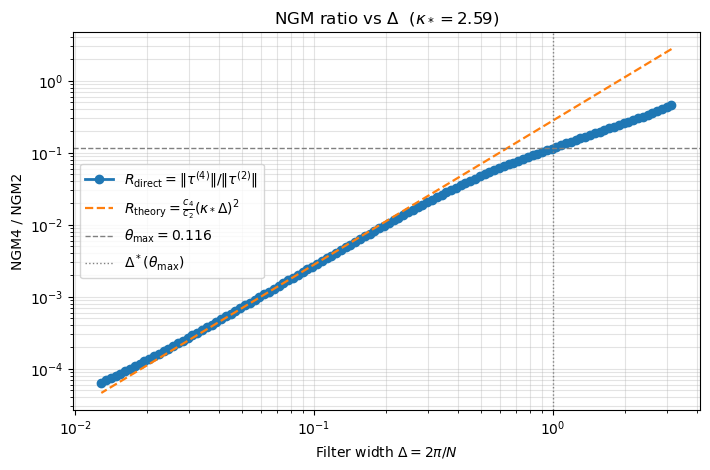

In [15]:
# ===================== NGM4 / NGM2 ratio — max θ with valid Δ² scaling (Δ = 2π/N) =====================
from jax import config
config.update("jax_enable_x64", True)

import h5py, gc
import numpy as np
import jax
import jax.numpy as jnp
import xarray as xr
import matplotlib.pyplot as plt

# --------------------- I/O: load .mat (v7.3, HDF5) -------------------------
def load_variable_from_mat(mat_file_path, variable_name):
    """Load a single variable from a MATLAB v7.3 .mat file (HDF5)."""
    try:
        with h5py.File(mat_file_path, 'r') as f:
            if variable_name in f:
                return np.array(f[variable_name])
            else:
                print(f"[WARN] Variable '{variable_name}' not found. Top-level keys: {list(f.keys())}")
                return None
    except Exception as e:
        print(f"[ERROR] {e}")
        return None

# ---- path + variable name (EDIT here if needed) ----
mat_file_path = r"/storage/scratch1/1/bchoi73/condensate_1e-5.mat"
var_name      = "intials"  # 2×nx×ny: [U, V]

s = load_variable_from_mat(mat_file_path, var_name)
assert s is not None, "Failed to load the variable from .mat"
V = s[1, :, :]
U = s[0, :, :]
u = np.stack([U, V], axis=-1)   # (nx, ny, 2)
arr = u[None, ...]              # (1, nx, ny, 2)
gc.collect()

# --------------------- constants & config -----------------------------------
C2, C4 = 1.0/12.0, 1.0/288.0
SAVE_FIG = False
FIG_PATH = "ngm_ratio_vs_delta.png"

# Candidate thresholds to test; dense grid for scanning θ_max
THETA_GRID = np.geomspace(0.01, 0.8, 60)   # adjust range if you need larger/smaller θ

# Δ sweep: Δ = 2π/N (avoid exactly hitting the endpoint)
N_min, N_max, N_points = 2, 512, 120
N_SWEEP = np.geomspace(N_min, N_max, N_points, endpoint=False)
Deltas  = 2.0*np.pi / N_SWEEP

# --------------------- FFT utilities on 2π×2π box --------------------------
nt, nx, ny, ncomp = arr.shape
assert ncomp == 2 and nx == ny, "Expect square grid and 2 velocity components."
L = 2.0*np.pi
dx = L / nx
dy = dx

kx = np.fft.fftfreq(nx, d=dx) * 2.0*np.pi
ky = np.fft.fftfreq(ny, d=dy) * 2.0*np.pi
kxg, kyg = np.meshgrid(kx, ky, indexing='ij')
ikx, iky = 1j*kxg, 1j*kyg
k2 = kxg**2 + kyg**2
kmag = np.sqrt(k2)

def fft2(a):  return np.fft.fftn(a, axes=(0,1))
def ifft2(A): return np.fft.ifftn(A, axes=(0,1)).real

def gaussian_filter_fft(field, Delta):
    """Isotropic Gaussian: G(k)=exp(-(kΔ)^2/24)."""
    G = np.exp(-(k2 * (Delta**2) / 24.0))
    return ifft2(fft2(field) * G)

def grad(field):
    """∇field for scalar field -> (∂x, ∂y) via FFT."""
    F = fft2(field)
    return ifft2(ikx*F), ifft2(iky*F)

def hessian_2d(field):
    """(f_xx, f_xy, f_yx, f_yy) via FFT (note: f_xy=f_yx)."""
    F = fft2(field)
    f_xx = ifft2(-(kxg**2) * F)
    f_yy = ifft2(-(kyg**2) * F)
    f_xy = ifft2((ikx * iky) * F)
    return f_xx, f_xy, f_xy, f_yy

# --------------------- κ* from isotropic spectrum ---------------------------
def iso_spectrum_2d(ux, uy):
    Ux = fft2(ux); Uy = fft2(uy)
    Eh = 0.5*(np.abs(Ux)**2 + np.abs(Uy)**2) / (nx*ny)**2
    k_shell = np.rint(kmag).astype(int)
    kmax = int(k_shell.max())
    E_shell = np.bincount(k_shell.ravel(), weights=Eh.ravel(), minlength=kmax+1).astype(float)
    ks = np.arange(kmax+1, dtype=float)
    return ks[1:], E_shell[1:]  # drop k=0

ux0, uy0 = arr[0, :, :, 0], arr[0, :, :, 1]
ks, Ek = iso_spectrum_2d(ux0, uy0)
M2 = float(np.sum((ks**2) * Ek))
M4 = float(np.sum((ks**4) * Ek))
assert M2 > 0 and M4 > 0, "Spectrum moments must be positive."
kappa_med = float(np.sqrt(M4 / M2))
print(f"[INFO] κ* (from spectrum) = {kappa_med:.3f}")

# --------------------- main: NGM4/NGM2 ratio sweep --------------------------
R_direct = np.empty_like(Deltas)
for i, Delta in enumerate(Deltas):
    Ux_bar_t = np.empty_like(arr[..., 0])
    Uy_bar_t = np.empty_like(arr[..., 1])
    for it in range(nt):
        Ux_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 0], Delta)
        Uy_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 1], Delta)

    ratios_t = []
    for it in range(nt):
        ux_b, uy_b = Ux_bar_t[it], Uy_bar_t[it]
        # --- NGM2: τ^{(2)}_{ij} = C2 Δ^2 (∂k u_i)(∂k u_j)
        ux_x, ux_y = grad(ux_b)
        uy_x, uy_y = grad(uy_b)
        Gxx = ux_x*ux_x + ux_y*ux_y
        Gxy = ux_x*uy_x + ux_y*uy_y
        Gyy = uy_x*uy_x + uy_y*uy_y
        t2_xx = C2 * (Delta**2) * Gxx
        t2_xy = C2 * (Delta**2) * Gxy
        t2_yy = C2 * (Delta**2) * Gyy

        # --- NGM4: τ^{(4)}_{ij} = C4 Δ^4 (∂k∂ℓ u_i)(∂k∂ℓ u_j)
        uxx_xx, uxx_xy, uxx_yx, uxx_yy = hessian_2d(ux_b)
        uyy_xx, uyy_xy, uyy_yx, uyy_yy = hessian_2d(uy_b)
        HxHx = (uxx_xx**2 + 2*uxx_xy**2 + uxx_yy**2)   # i=j=x
        HyHy = (uyy_xx**2 + 2*uyy_xy**2 + uyy_yy**2)   # i=j=y
        HxHy = (uxx_xx*uyy_xx + 2*uxx_xy*uyy_xy + uxx_yy*uyy_yy)  # i=x, j=y

        t4_xx = C4 * (Delta**4) * HxHx
        t4_xy = C4 * (Delta**4) * HxHy
        t4_yy = C4 * (Delta**4) * HyHy

        # Frobenius norms and ratio
        n2 = np.sqrt(np.mean(t2_xx**2 + 2*t2_xy**2 + t2_yy**2))
        n4 = np.sqrt(np.mean(t4_xx**2 + 2*t4_xy**2 + t4_yy**2))
        ratios_t.append(n4 / (n2 + 1e-30))

    R_direct[i] = float(np.median(ratios_t))

# --------------------- helpers: envelope, slopes, crossings -----------------
def log_slope(x, y):
    """Central-diff slope d log y / d log x."""
    lx, ly = np.log(x), np.log(y)
    s = np.empty_like(y)
    s[0]  = (ly[1]-ly[0])/(lx[1]-lx[0]+1e-30)
    s[-1] = (ly[-1]-ly[-2])/(lx[-1]-lx[-2]+1e-30)
    s[1:-1] = (ly[2:]-ly[:-2])/(lx[2:]-lx[:-2]+1e-30)
    return s

def first_cross_loglog(x, y, level):
    """First x where y(x) >= level using envelope + log–log interpolation."""
    x = np.asarray(x); y = np.asarray(y)
    m = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)
    x, y = x[m], y[m]
    order = np.argsort(x)
    x, y = x[order], y[order]
    y_env = np.maximum.accumulate(y)
    if not (y_env[0] <= level <= y_env[-1]):
        return None, None  # Δ*, index*
    j = np.argmax(y_env >= level)
    if j == 0:
        return x[0], 0
    x0, x1 = x[j-1], x[j]
    y0, y1 = y_env[j-1], y_env[j]
    t = (np.log(level) - np.log(y0)) / (np.log(y1) - np.log(y0) + 1e-30)
    x_star = np.exp((1.0 - t)*np.log(x0) + t*np.log(x1))
    return x_star, j

def fit_alpha_fixed_slope(x, y, kappa, c_ratio=(1.0/288.0)/(1.0/12.0)):
    """
    Fit α in:  R ≈ α * (c4/c2) * (κ Δ)^2  over (x,y) window.
    Returns alpha_hat, R2, mean_slope.
    """
    # basic checks
    m = np.isfinite(x) & np.isfinite(y) & (x>0) & (y>0)
    x, y = x[m], y[m]
    if x.size < 5:
        return np.nan, np.nan, np.nan
    # slope estimate
    s = log_slope(x, y)
    mean_slope = float(np.mean(s))
    # alpha via log means
    logC = np.log(c_ratio)
    rhs  = np.log(y) - (logC + 2.0*np.log(kappa) + 2.0*np.log(x))
    alpha_hat = float(np.exp(np.mean(rhs)))
    # R^2 for the fixed-slope model
    y_fit = alpha_hat * c_ratio * (kappa**2) * (x**2)
    ss_res = float(np.sum((np.log(y) - np.log(y_fit))**2))
    ss_tot = float(np.sum((np.log(y) - np.mean(np.log(y)))**2)) + 1e-30
    R2 = 1.0 - ss_res/ss_tot
    return alpha_hat, R2, mean_slope

# --------------------- scan θ to find max-θ with valid Δ² scaling ----------
# Criteria (tune as needed):
MIN_PTS     = 8                  # minimum number of points in the window
SLOPE_LO    = 1.7                # acceptable mean slope bounds
SLOPE_HI    = 2.3
R2_MIN      = 0.98               # goodness of fit threshold (on log scale)
PAD_POINTS  = 2                  # include a couple of points beyond the crossing bracket

# Build monotone envelope for partitioning windows
order = np.argsort(Deltas)
Dx = Deltas[order]
Ry = R_direct[order]
Ry_env = np.maximum.accumulate(Ry)

results = []
for theta in THETA_GRID:
    # find Δ* (first crossing). If none, use full range where y<=theta
    Dstar, j_cross = first_cross_loglog(Dx, Ry, theta)
    if Dstar is None:
        # No crossing inside sweep; the valid window is the entire region below theta
        mask = Ry_env <= theta
        idxs = np.where(mask)[0]
    else:
        # Take all points with envelope <= theta up to the crossing index, plus a small pad
        idxs = np.arange(0, min(len(Dx)-1, j_cross + PAD_POINTS) + 1)

    if idxs.size < MIN_PTS:
        results.append((theta, np.nan, np.nan, np.nan, np.nan, idxs.size))
        continue

    x_win = Dx[idxs]; y_win = Ry[idxs]
    alpha_hat, R2, mean_slope = fit_alpha_fixed_slope(x_win, y_win, kappa_med)
    results.append((theta, alpha_hat, R2, mean_slope, (2.0*np.pi)/(Dx[idxs[-1]]), idxs.size))
    # tuple: (θ, α, R2, mean_slope, N_at_last_point, n_pts)

# Choose the largest θ satisfying the criteria
valid = [(t,a,R2,s,Nlast,n) for (t,a,R2,s,Nlast,n) in results
         if np.isfinite(R2) and (R2 >= R2_MIN) and (SLOPE_LO <= s <= SLOPE_HI) and (n >= MIN_PTS)]
theta_max = None
if valid:
    theta_max = max(valid, key=lambda z: z[0])
    t_best, a_best, R2_best, slope_best, N_last_best, n_best = theta_max
    D_best, _ = first_cross_loglog(Dx, Ry, t_best)
    N_best = (2.0*np.pi / D_best) if D_best is not None else np.nan
else:
    t_best = a_best = R2_best = slope_best = N_last_best = N_best = np.nan

# --------------------- report --------------------------
print("\n=== θ-scan (increasing θ): criteria R2≥{:.3f}, slope∈[{:.1f},{:.1f}], ≥{} pts ==="
      .format(R2_MIN, SLOPE_LO, SLOPE_HI, MIN_PTS))
print("θ\talpha\tR2\tmean_slope\tN(last)\tn_pts")
for (t,a,R2,s,Nlast,n) in results:
    print("{:.4f}\t{}\t{}\t{}\t{}\t{}".format(
        t,
        "nan" if not np.isfinite(a) else f"{a:.3f}",
        "nan" if not np.isfinite(R2) else f"{R2:.3f}",
        "nan" if not np.isfinite(s) else f"{s:.3f}",
        "nan" if not np.isfinite(Nlast) else f"{Nlast:.2f}",
        n))

print("\n=== Selected max θ where scaling holds (given criteria) ===")
if valid:
    print(f"θ_max = {t_best:.4f}  |  alpha≈{a_best:.3f},  R2≈{R2_best:.3f},  mean slope≈{slope_best:.3f}")
    if np.isfinite(N_best):
        print(f"Δ*(θ_max)≈{D_best:.4f},  N*(θ_max)≈{N_best:.2f}")
else:
    print("No θ satisfied all criteria. Consider relaxing R2_MIN or slope bounds, or extend sweep.")

# --------------------- plot --------------------------
R_theory = (C4/C2) * (kappa_med**2) * (Deltas**2)

plt.figure(figsize=(7.2,4.8))
plt.plot(Dx, Ry, 'o-', lw=2, label=r'$R_{\rm direct}=\|\tau^{(4)}\|/\|\tau^{(2)}\|$')
plt.plot(Deltas, R_theory, '--', lw=1.6, label=rf'$R_{{\rm theory}}=\frac{{c_4}}{{c_2}}(\kappa_*\Delta)^2$')

# mark θ_max and its Δ*
if valid and np.isfinite(D_best):
    plt.axhline(t_best, ls='--', lw=1, color='gray', label=fr'$\theta_{{\max}}={t_best:.3f}$')
    plt.axvline(D_best, ls=':',  lw=1, color='gray', label=fr'$\Delta^*(\theta_{{\max}})$')

plt.xscale('log'); plt.yscale('log')
plt.xlabel(r'Filter width $\Delta = 2\pi/N$')
plt.ylabel(r'NGM4 / NGM2')
plt.title(fr'NGM ratio vs $\Delta$  ($\kappa_*={kappa_med:.2f}$)')
plt.grid(True, which='both', alpha=0.35)
plt.legend()
plt.tight_layout()
if SAVE_FIG:
    plt.savefig(FIG_PATH, dpi=200)
plt.show()
# ======================================================================================================

In [ ]:
# ===================== NGM4 / NGM2 ratio — max θ with valid Δ² scaling (Δ = 2π/N) =====================
from jax import config
config.update("jax_enable_x64", True)

import h5py, gc
import numpy as np
import jax
import jax.numpy as jnp
import xarray as xr
import matplotlib.pyplot as plt

# --------------------- I/O: load .mat (v7.3, HDF5) -------------------------
def load_variable_from_mat(mat_file_path, variable_name):
    """Load a single variable from a MATLAB v7.3 .mat file (HDF5)."""
    try:
        with h5py.File(mat_file_path, 'r') as f:
            if variable_name in f:
                return np.array(f[variable_name])
            else:
                print(f"[WARN] Variable '{variable_name}' not found. Top-level keys: {list(f.keys())}")
                return None
    except Exception as e:
        print(f"[ERROR] {e}")
        return None

# ---- path + variable name (EDIT here if needed) ----
mat_file_path = r"/storage/scratch1/1/bchoi73/maturevm_1e-5.mat"
var_name      = "intials"  # 2×nx×ny: [U, V]

s = load_variable_from_mat(mat_file_path, var_name)
assert s is not None, "Failed to load the variable from .mat"
V = s[1, :, :]
U = s[0, :, :]
u = np.stack([U, V], axis=-1)   # (nx, ny, 2)
arr = u[None, ...]              # (1, nx, ny, 2)
gc.collect()

# --------------------- constants & config -----------------------------------
C2, C4 = 1.0/12.0, 1.0/288.0
SAVE_FIG = False
FIG_PATH = "ngm_ratio_vs_delta.png"

# Candidate thresholds to test; dense grid for scanning θ_max
THETA_GRID = np.geomspace(0.01, 0.8, 60)   # adjust range if you need larger/smaller θ

# Δ sweep: Δ = 2π/N (avoid exactly hitting the endpoint)
N_min, N_max, N_points = 2, 512, 120
N_SWEEP = np.geomspace(N_min, N_max, N_points, endpoint=False)
Deltas  = 2.0*np.pi / N_SWEEP

# --------------------- FFT utilities on 2π×2π box --------------------------
nt, nx, ny, ncomp = arr.shape
assert ncomp == 2 and nx == ny, "Expect square grid and 2 velocity components."
L = 2.0*np.pi
dx = L / nx
dy = dx

kx = np.fft.fftfreq(nx, d=dx) * 2.0*np.pi
ky = np.fft.fftfreq(ny, d=dy) * 2.0*np.pi
kxg, kyg = np.meshgrid(kx, ky, indexing='ij')
ikx, iky = 1j*kxg, 1j*kyg
k2 = kxg**2 + kyg**2
kmag = np.sqrt(k2)

def fft2(a):  return np.fft.fftn(a, axes=(0,1))
def ifft2(A): return np.fft.ifftn(A, axes=(0,1)).real

def gaussian_filter_fft(field, Delta):
    """Isotropic Gaussian: G(k)=exp(-(kΔ)^2/24)."""
    G = np.exp(-(k2 * (Delta**2) / 24.0))
    return ifft2(fft2(field) * G)

def grad(field):
    """∇field for scalar field -> (∂x, ∂y) via FFT."""
    F = fft2(field)
    return ifft2(ikx*F), ifft2(iky*F)

def hessian_2d(field):
    """(f_xx, f_xy, f_yx, f_yy) via FFT (note: f_xy=f_yx)."""
    F = fft2(field)
    f_xx = ifft2(-(kxg**2) * F)
    f_yy = ifft2(-(kyg**2) * F)
    f_xy = ifft2((ikx * iky) * F)
    return f_xx, f_xy, f_xy, f_yy

# --------------------- κ* from isotropic spectrum ---------------------------
def iso_spectrum_2d(ux, uy):
    Ux = fft2(ux); Uy = fft2(uy)
    Eh = 0.5*(np.abs(Ux)**2 + np.abs(Uy)**2) / (nx*ny)**2
    k_shell = np.rint(kmag).astype(int)
    kmax = int(k_shell.max())
    E_shell = np.bincount(k_shell.ravel(), weights=Eh.ravel(), minlength=kmax+1).astype(float)
    ks = np.arange(kmax+1, dtype=float)
    return ks[1:], E_shell[1:]  # drop k=0

ux0, uy0 = arr[0, :, :, 0], arr[0, :, :, 1]
ks, Ek = iso_spectrum_2d(ux0, uy0)
M2 = float(np.sum((ks**2) * Ek))
M4 = float(np.sum((ks**4) * Ek))
assert M2 > 0 and M4 > 0, "Spectrum moments must be positive."
kappa_med = float(np.sqrt(M4 / M2))
print(f"[INFO] κ* (from spectrum) = {kappa_med:.3f}")

# --------------------- main: NGM4/NGM2 ratio sweep --------------------------
R_direct = np.empty_like(Deltas)
for i, Delta in enumerate(Deltas):
    Ux_bar_t = np.empty_like(arr[..., 0])
    Uy_bar_t = np.empty_like(arr[..., 1])
    for it in range(nt):
        Ux_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 0], Delta)
        Uy_bar_t[it] = gaussian_filter_fft(arr[it, :, :, 1], Delta)

    ratios_t = []
    for it in range(nt):
        ux_b, uy_b = Ux_bar_t[it], Uy_bar_t[it]
        # --- NGM2: τ^{(2)}_{ij} = C2 Δ^2 (∂k u_i)(∂k u_j)
        ux_x, ux_y = grad(ux_b)
        uy_x, uy_y = grad(uy_b)
        Gxx = ux_x*ux_x + ux_y*ux_y
        Gxy = ux_x*uy_x + ux_y*uy_y
        Gyy = uy_x*uy_x + uy_y*uy_y
        t2_xx = C2 * (Delta**2) * Gxx
        t2_xy = C2 * (Delta**2) * Gxy
        t2_yy = C2 * (Delta**2) * Gyy

        # --- NGM4: τ^{(4)}_{ij} = C4 Δ^4 (∂k∂ℓ u_i)(∂k∂ℓ u_j)
        uxx_xx, uxx_xy, uxx_yx, uxx_yy = hessian_2d(ux_b)
        uyy_xx, uyy_xy, uyy_yx, uyy_yy = hessian_2d(uy_b)
        HxHx = (uxx_xx**2 + 2*uxx_xy**2 + uxx_yy**2)   # i=j=x
        HyHy = (uyy_xx**2 + 2*uyy_xy**2 + uyy_yy**2)   # i=j=y
        HxHy = (uxx_xx*uyy_xx + 2*uxx_xy*uyy_xy + uxx_yy*uyy_yy)  # i=x, j=y

        t4_xx = C4 * (Delta**4) * HxHx
        t4_xy = C4 * (Delta**4) * HxHy
        t4_yy = C4 * (Delta**4) * HyHy

        # Frobenius norms and ratio
        n2 = np.sqrt(np.mean(t2_xx**2 + 2*t2_xy**2 + t2_yy**2))
        n4 = np.sqrt(np.mean(t4_xx**2 + 2*t4_xy**2 + t4_yy**2))
        ratios_t.append(n4 / (n2 + 1e-30))

    R_direct[i] = float(np.median(ratios_t))

# --------------------- helpers: envelope, slopes, crossings -----------------
def log_slope(x, y):
    """Central-diff slope d log y / d log x."""
    lx, ly = np.log(x), np.log(y)
    s = np.empty_like(y)
    s[0]  = (ly[1]-ly[0])/(lx[1]-lx[0]+1e-30)
    s[-1] = (ly[-1]-ly[-2])/(lx[-1]-lx[-2]+1e-30)
    s[1:-1] = (ly[2:]-ly[:-2])/(lx[2:]-lx[:-2]+1e-30)
    return s

def first_cross_loglog(x, y, level):
    """First x where y(x) >= level using envelope + log–log interpolation."""
    x = np.asarray(x); y = np.asarray(y)
    m = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)
    x, y = x[m], y[m]
    order = np.argsort(x)
    x, y = x[order], y[order]
    y_env = np.maximum.accumulate(y)
    if not (y_env[0] <= level <= y_env[-1]):
        return None, None  # Δ*, index*
    j = np.argmax(y_env >= level)
    if j == 0:
        return x[0], 0
    x0, x1 = x[j-1], x[j]
    y0, y1 = y_env[j-1], y_env[j]
    t = (np.log(level) - np.log(y0)) / (np.log(y1) - np.log(y0) + 1e-30)
    x_star = np.exp((1.0 - t)*np.log(x0) + t*np.log(x1))
    return x_star, j

def fit_alpha_fixed_slope(x, y, kappa, c_ratio=(1.0/288.0)/(1.0/12.0)):
    """
    Fit α in:  R ≈ α * (c4/c2) * (κ Δ)^2  over (x,y) window.
    Returns alpha_hat, R2, mean_slope.
    """
    # basic checks
    m = np.isfinite(x) & np.isfinite(y) & (x>0) & (y>0)
    x, y = x[m], y[m]
    if x.size < 5:
        return np.nan, np.nan, np.nan
    # slope estimate
    s = log_slope(x, y)
    mean_slope = float(np.mean(s))
    # alpha via log means
    logC = np.log(c_ratio)
    rhs  = np.log(y) - (logC + 2.0*np.log(kappa) + 2.0*np.log(x))
    alpha_hat = float(np.exp(np.mean(rhs)))
    # R^2 for the fixed-slope model
    y_fit = alpha_hat * c_ratio * (kappa**2) * (x**2)
    ss_res = float(np.sum((np.log(y) - np.log(y_fit))**2))
    ss_tot = float(np.sum((np.log(y) - np.mean(np.log(y)))**2)) + 1e-30
    R2 = 1.0 - ss_res/ss_tot
    return alpha_hat, R2, mean_slope

# --------------------- scan θ to find max-θ with valid Δ² scaling ----------
# Criteria (tune as needed):
MIN_PTS     = 8                  # minimum number of points in the window
SLOPE_LO    = 1.7                # acceptable mean slope bounds
SLOPE_HI    = 2.3
R2_MIN      = 0.98               # goodness of fit threshold (on log scale)
PAD_POINTS  = 2                  # include a couple of points beyond the crossing bracket

# Build monotone envelope for partitioning windows
order = np.argsort(Deltas)
Dx = Deltas[order]
Ry = R_direct[order]
Ry_env = np.maximum.accumulate(Ry)

results = []
for theta in THETA_GRID:
    # find Δ* (first crossing). If none, use full range where y<=theta
    Dstar, j_cross = first_cross_loglog(Dx, Ry, theta)
    if Dstar is None:
        # No crossing inside sweep; the valid window is the entire region below theta
        mask = Ry_env <= theta
        idxs = np.where(mask)[0]
    else:
        # Take all points with envelope <= theta up to the crossing index, plus a small pad
        idxs = np.arange(0, min(len(Dx)-1, j_cross + PAD_POINTS) + 1)

    if idxs.size < MIN_PTS:
        results.append((theta, np.nan, np.nan, np.nan, np.nan, idxs.size))
        continue

    x_win = Dx[idxs]; y_win = Ry[idxs]
    alpha_hat, R2, mean_slope = fit_alpha_fixed_slope(x_win, y_win, kappa_med)
    results.append((theta, alpha_hat, R2, mean_slope, (2.0*np.pi)/(Dx[idxs[-1]]), idxs.size))
    # tuple: (θ, α, R2, mean_slope, N_at_last_point, n_pts)

# Choose the largest θ satisfying the criteria
valid = [(t,a,R2,s,Nlast,n) for (t,a,R2,s,Nlast,n) in results
         if np.isfinite(R2) and (R2 >= R2_MIN) and (SLOPE_LO <= s <= SLOPE_HI) and (n >= MIN_PTS)]
theta_max = None
if valid:
    theta_max = max(valid, key=lambda z: z[0])
    t_best, a_best, R2_best, slope_best, N_last_best, n_best = theta_max
    D_best, _ = first_cross_loglog(Dx, Ry, t_best)
    N_best = (2.0*np.pi / D_best) if D_best is not None else np.nan
else:
    t_best = a_best = R2_best = slope_best = N_last_best = N_best = np.nan

# --------------------- report --------------------------
print("\n=== θ-scan (increasing θ): criteria R2≥{:.3f}, slope∈[{:.1f},{:.1f}], ≥{} pts ==="
      .format(R2_MIN, SLOPE_LO, SLOPE_HI, MIN_PTS))
print("θ\talpha\tR2\tmean_slope\tN(last)\tn_pts")
for (t,a,R2,s,Nlast,n) in results:
    print("{:.4f}\t{}\t{}\t{}\t{}\t{}".format(
        t,
        "nan" if not np.isfinite(a) else f"{a:.3f}",
        "nan" if not np.isfinite(R2) else f"{R2:.3f}",
        "nan" if not np.isfinite(s) else f"{s:.3f}",
        "nan" if not np.isfinite(Nlast) else f"{Nlast:.2f}",
        n))

print("\n=== Selected max θ where scaling holds (given criteria) ===")
if valid:
    print(f"θ_max = {t_best:.4f}  |  alpha≈{a_best:.3f},  R2≈{R2_best:.3f},  mean slope≈{slope_best:.3f}")
    if np.isfinite(N_best):
        print(f"Δ*(θ_max)≈{D_best:.4f},  N*(θ_max)≈{N_best:.2f}")
else:
    print("No θ satisfied all criteria. Consider relaxing R2_MIN or slope bounds, or extend sweep.")

# --------------------- plot --------------------------
R_theory = (C4/C2) * (kappa_med**2) * (Deltas**2)

plt.figure(figsize=(7.2,4.8))
plt.plot(Dx, Ry, 'o-', lw=2, label=r'$R_{\rm direct}=\|\tau^{(4)}\|/\|\tau^{(2)}\|$')
plt.plot(Deltas, R_theory, '--', lw=1.6, label=rf'$R_{{\rm theory}}=\frac{{c_4}}{{c_2}}(\kappa_*\Delta)^2$')

# mark θ_max and its Δ*
if valid and np.isfinite(D_best):
    plt.axhline(t_best, ls='--', lw=1, color='gray', label=fr'$\theta_{{\max}}={t_best:.3f}$')
    plt.axvline(D_best, ls=':',  lw=1, color='gray', label=fr'$\Delta^*(\theta_{{\max}})$')

plt.xscale('log'); plt.yscale('log')
plt.xlabel(r'Filter width $\Delta = 2\pi/N$')
plt.ylabel(r'NGM4 / NGM2')
plt.title(fr'NGM ratio vs $\Delta$  ($\kappa_*={kappa_med:.2f}$)')
plt.grid(True, which='both', alpha=0.35)
plt.legend()
plt.tight_layout()
if SAVE_FIG:
    plt.savefig(FIG_PATH, dpi=200)
plt.show()
# ======================================================================================================

[INFO] κ* (from spectrum) = 9.778


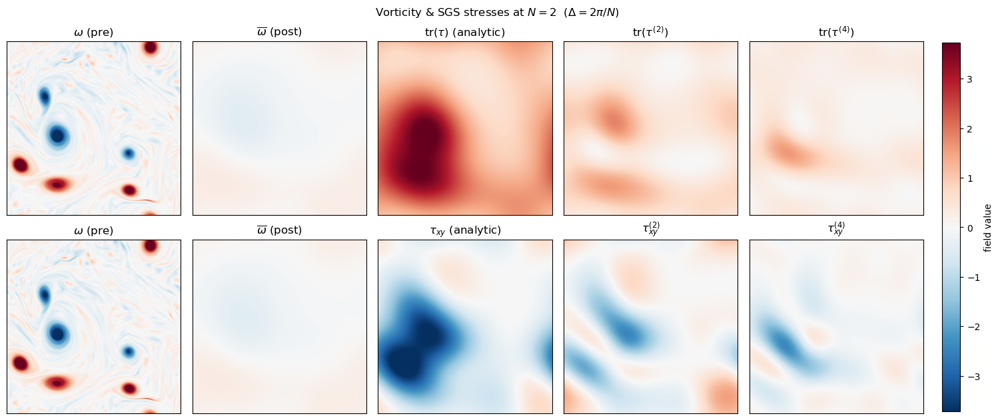

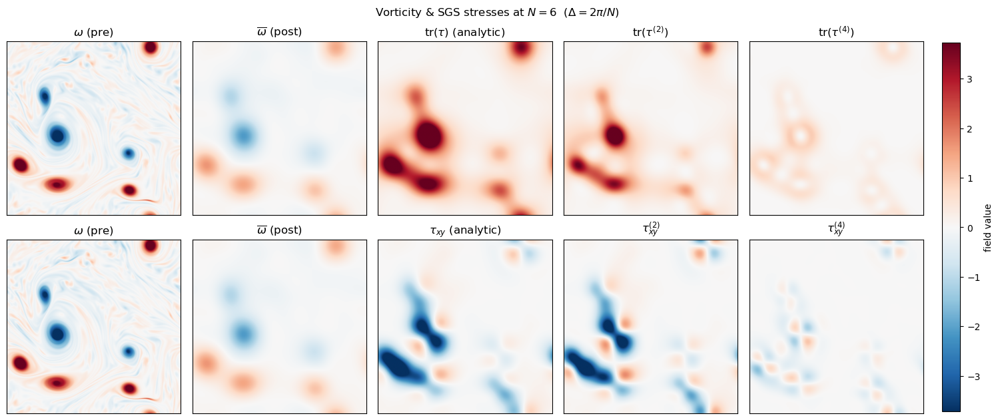

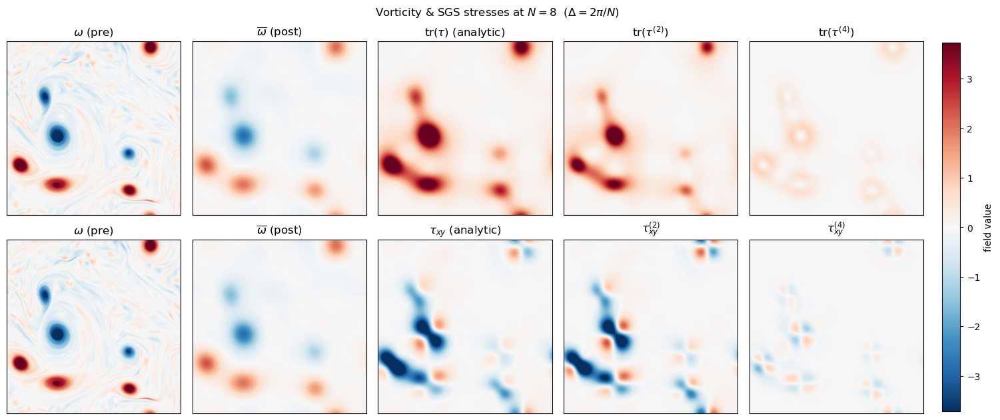

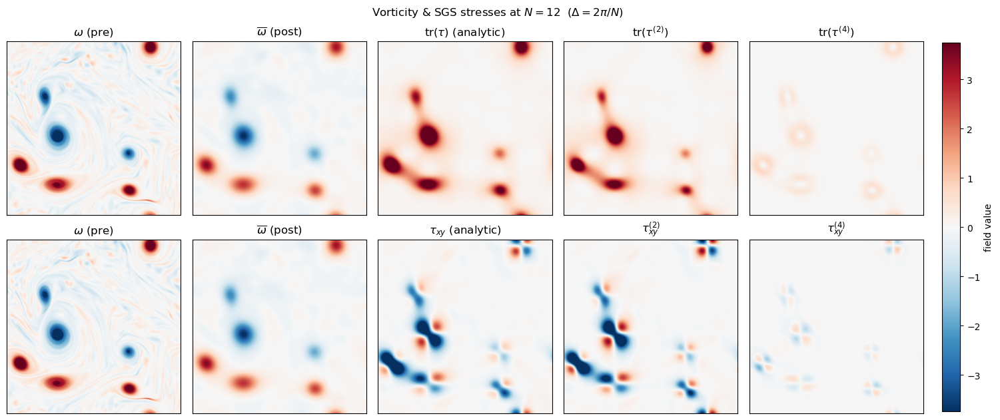

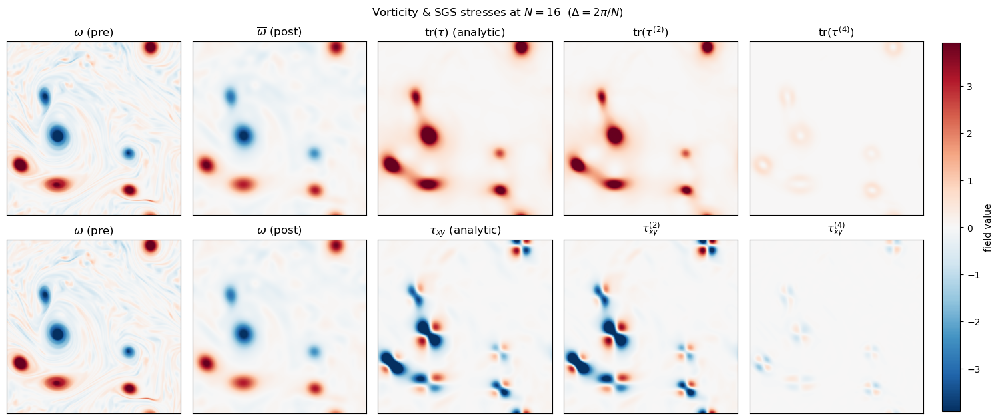

...

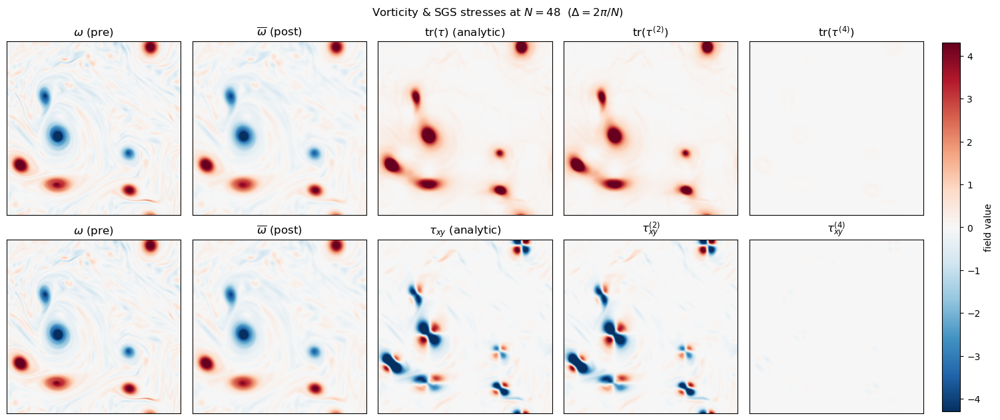

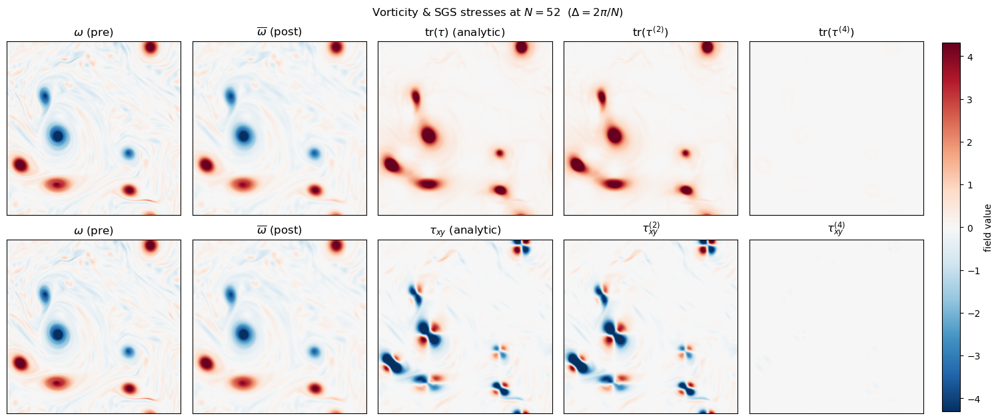

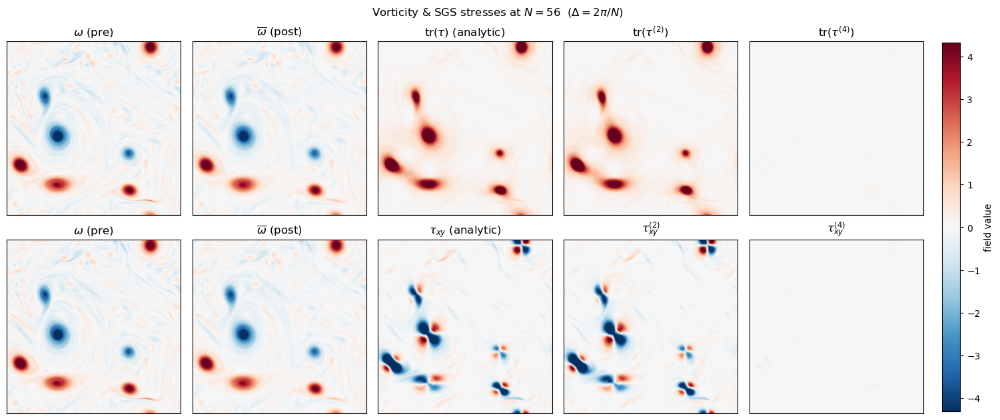

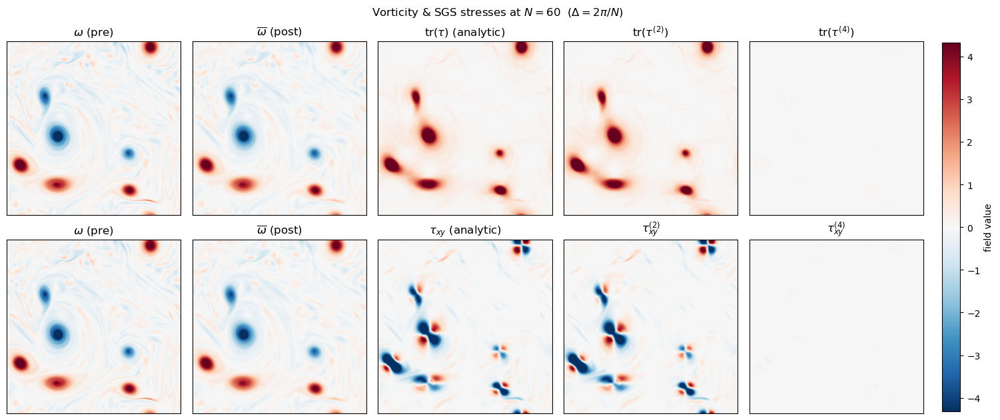

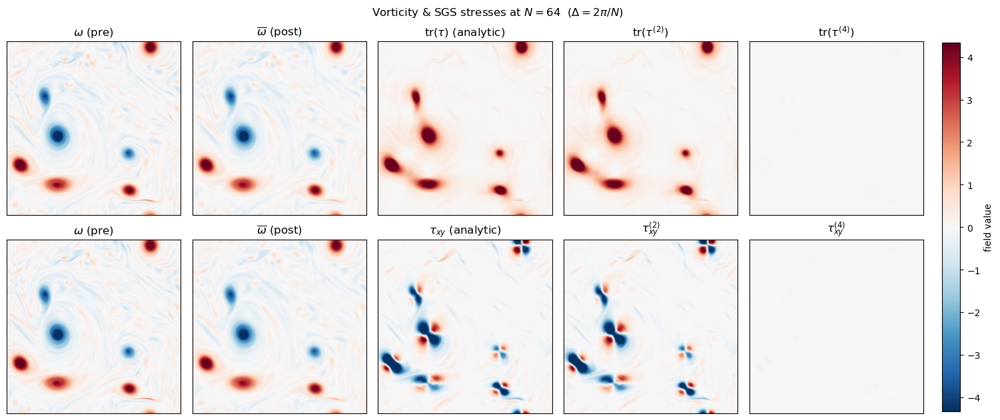

In [7]:
# ===================== Per-N panels for vorticity & τ (trace/off-diagonal) =====================
# Self-contained: defines spectral helpers, loads snapshot, and plots for N in {16,32,64}.
# Assumes a 2π × 2π periodic box.

from jax import config
config.update("jax_enable_x64", True)

import h5py, gc
import numpy as np
import matplotlib.pyplot as plt

# --------------------- I/O: load .mat (v7.3, HDF5) -------------------------
def load_variable_from_mat(mat_file_path, variable_name):
    """Load a single variable from a MATLAB v7.3 .mat file (HDF5)."""
    try:
        with h5py.File(mat_file_path, 'r') as f:
            if variable_name in f:
                return np.array(f[variable_name])
            else:
                print(f"[WARN] Variable '{variable_name}' not found. Top-level keys: {list(f.keys())}")
                return None
    except Exception as e:
        print(f"[ERROR] {e}")
        return None

# ---- path + variable name (EDIT here if needed) ----
mat_file_path = r"/storage/scratch1/1/bchoi73/maturevm_1e-5.mat"
var_name      = "intials"  # 2×nx×ny: [U, V]

s = load_variable_from_mat(mat_file_path, var_name)
assert s is not None, "Failed to load the variable from .mat"

# Unpack snapshot (take initial frame)
Ux = s[0, :, :].astype(float)  # (nx, ny)
Uy = s[1, :, :].astype(float)  # (nx, ny)
ux0, uy0 = Ux, Uy              # naming used below
gc.collect()

# --------------------- constants & domain -----------------------------------
C2, C4 = 1.0/12.0, 1.0/288.0
nx, ny = ux0.shape
assert nx == ny, "Expect square grid (nx == ny)."
L = 2.0*np.pi
dx = L / nx
dy = dx

# --------------------- spectral operators (2π box) --------------------------
kx = np.fft.fftfreq(nx, d=dx) * 2.0*np.pi  # shape (nx,)
ky = np.fft.fftfreq(ny, d=dy) * 2.0*np.pi  # shape (ny,)
kxg, kyg = np.meshgrid(kx, ky, indexing='ij')  # (nx,ny)
ikx, iky = 1j*kxg, 1j*kyg
k2 = kxg**2 + kyg**2

def fft2(a):  return np.fft.fftn(a, axes=(0,1))
def ifft2(A): return np.fft.ifftn(A, axes=(0,1)).real

def gaussian_filter_fft(field, Delta):
    """Isotropic Gaussian: G(k)=exp(-(kΔ)^2/24)."""
    G = np.exp(-(k2 * (Delta**2) / 24.0))
    return ifft2(fft2(field) * G)

def grad(field):
    """∇field for scalar field -> (∂x, ∂y) via FFT."""
    F = fft2(field)
    return ifft2(ikx*F), ifft2(iky*F)

def hessian_2d(field):
    """(f_xx, f_xy, f_yx, f_yy) via FFT (note: f_xy=f_yx)."""
    F = fft2(field)
    f_xx = ifft2(-(kxg**2) * F)
    f_yy = ifft2(-(kyg**2) * F)
    f_xy = ifft2((ikx * iky) * F)
    return f_xx, f_xy, f_xy, f_yy

# --------------------- physics helpers --------------------------------------
def vorticity(u, v):
    ux, uy = grad(u)
    vx, vy = grad(v)
    return vx - uy

def analytic_tau(u, v, Delta):
    """τ_ij = overline(u_i u_j) - ubar_i ubar_j with Gaussian filter."""
    uu = u * u
    uv = u * v
    vv = v * v
    uu_bar = gaussian_filter_fft(uu, Delta)
    uv_bar = gaussian_filter_fft(uv, Delta)
    vv_bar = gaussian_filter_fft(vv, Delta)

    u_bar = gaussian_filter_fft(u, Delta)
    v_bar = gaussian_filter_fft(v, Delta)

    tau_xx = uu_bar - u_bar * u_bar
    tau_xy = uv_bar - u_bar * v_bar
    tau_yy = vv_bar - v_bar * v_bar
    return tau_xx, tau_xy, tau_yy, u_bar, v_bar

def ngm2_tau(u_bar, v_bar, Delta):
    """NGM2: τ^{(2)}_{ij} = C2 Δ^2 (∂k u_i)(∂k u_j)."""
    ux_x, ux_y = grad(u_bar)
    vy_x, vy_y = grad(v_bar)

    Gxx = ux_x*ux_x + ux_y*ux_y
    Gxy = ux_x*vy_x + ux_y*vy_y
    Gyy = vy_x*vy_x + vy_y*vy_y

    t2_xx = C2 * (Delta**2) * Gxx
    t2_xy = C2 * (Delta**2) * Gxy
    t2_yy = C2 * (Delta**2) * Gyy
    return t2_xx, t2_xy, t2_yy

def ngm4_tau(u_bar, v_bar, Delta):
    """NGM4: τ^{(4)}_{ij} = C4 Δ^4 (∂k∂ℓ u_i)(∂k∂ℓ u_j) with full Hessian contractions."""
    uxx_xx, uxx_xy, _, uxx_yy = hessian_2d(u_bar)
    vvv_xx, vvv_xy, _, vvv_yy = hessian_2d(v_bar)

    # Frobenius-like contractions (ixx, ixy, iyy with symmetry)
    HxHx = (uxx_xx**2 + 2.0*uxx_xy**2 + uxx_yy**2)
    HyHy = (vvv_xx**2 + 2.0*vvv_xy**2 + vvv_yy**2)
    HxHy = (uxx_xx*vvv_xx + 2.0*uxx_xy*vvv_xy + uxx_yy*vvv_yy)

    t4_xx = C4 * (Delta**4) * HxHx
    t4_xy = C4 * (Delta**4) * HxHy
    t4_yy = C4 * (Delta**4) * HyHy
    return t4_xx, t4_xy, t4_yy

def nice_clim(*fields, pct=99.0):
    """Symmetric clim using a high percentile over all fields."""
    vals = np.concatenate([np.asarray(f).ravel() for f in fields])
    v = np.nanpercentile(np.abs(vals), pct)
    if not np.isfinite(v) or v <= 0:
        v = float(np.max(np.abs(vals)))
    return (-v, v)

def plot_panels_for_N(N, save=False):
    Delta = 2.0*np.pi / float(N)
    # Analytic τ (and filtered velocities)
    tau_xx, tau_xy, tau_yy, u_bar, v_bar = analytic_tau(ux0, uy0, Delta)
    # NGM2 / NGM4 "contribution only"
    t2_xx, t2_xy, t2_yy = ngm2_tau(u_bar, v_bar, Delta)
    t4_xx, t4_xy, t4_yy = ngm4_tau(u_bar, v_bar, Delta)

    # Vorticity (pre & post)
    w0   = vorticity(ux0, uy0)
    wbar = vorticity(u_bar, v_bar)

    # Traces and off-diagonal
    tr_analytic = tau_xx + tau_yy
    tr_ngm2     = t2_xx + t2_yy
    tr_ngm4     = t4_xx + t4_yy

    # Shared color limits (per row) to compare apples-to-apples
    clim_w  = nice_clim(w0, wbar, pct=99.5)
    clim_tr = nice_clim(tr_analytic, tr_ngm2, tr_ngm4, pct=99.0)
    clim_xy = nice_clim(tau_xy, t2_xy, t4_xy, pct=99.0)

    fig, axes = plt.subplots(2, 5, figsize=(15, 6.2), constrained_layout=True)

    # Row 1: vorticity & traces
    im = axes[0,0].imshow(w0,   origin='lower', cmap='RdBu_r', vmin=clim_w[0],  vmax=clim_w[1]);  axes[0,0].set_title(r'$\omega$ (pre)')
    axes[0,1].imshow(wbar, origin='lower', cmap='RdBu_r', vmin=clim_w[0],  vmax=clim_w[1]);  axes[0,1].set_title(r'$\overline{\omega}$ (post)')
    axes[0,2].imshow(tr_analytic, origin='lower', cmap='RdBu_r', vmin=clim_tr[0], vmax=clim_tr[1]); axes[0,2].set_title(r'$\mathrm{tr}(\tau)$ (analytic)')
    axes[0,3].imshow(tr_ngm2,     origin='lower', cmap='RdBu_r', vmin=clim_tr[0], vmax=clim_tr[1]); axes[0,3].set_title(r'$\mathrm{tr}(\tau^{(2)})$')
    axes[0,4].imshow(tr_ngm4,     origin='lower', cmap='RdBu_r', vmin=clim_tr[0], vmax=clim_tr[1]); axes[0,4].set_title(r'$\mathrm{tr}(\tau^{(4)})$')

    # Row 2: vorticity & off-diagonals
    axes[1,0].imshow(w0, origin='lower', cmap='RdBu_r', vmin=clim_w[0],  vmax=clim_w[1]);  axes[1,0].set_title(r'$\omega$ (pre)')
    axes[1,1].imshow(wbar, origin='lower', cmap='RdBu_r', vmin=clim_w[0],  vmax=clim_w[1]);  axes[1,1].set_title(r'$\overline{\omega}$ (post)')
    axes[1,2].imshow(tau_xy, origin='lower', cmap='RdBu_r', vmin=clim_xy[0], vmax=clim_xy[1]); axes[1,2].set_title(r'$\tau_{xy}$ (analytic)')
    axes[1,3].imshow(t2_xy,  origin='lower', cmap='RdBu_r', vmin=clim_xy[0], vmax=clim_xy[1]); axes[1,3].set_title(r'$\tau^{(2)}_{xy}$')
    axes[1,4].imshow(t4_xy,  origin='lower', cmap='RdBu_r', vmin=clim_xy[0], vmax=clim_xy[1]); axes[1,4].set_title(r'$\tau^{(4)}_{xy}$')

    # Shared cosmetics
    for ax in axes.ravel():
        ax.set_xticks([]); ax.set_yticks([])

    fig.suptitle(fr'Vorticity & SGS stresses at $N={N}$  ($\Delta=2\pi/N$)', fontsize=12)
    cbar = fig.colorbar(im, ax=axes, location='right', fraction=0.02, pad=0.02)
    cbar.ax.set_ylabel('field value', rotation=90)

    if save:
        plt.savefig(f"panels_vort_tau_N{N}.png", dpi=180)
    plt.show()

# --- Make panels for N = 16, 32, 64 ---
for N in (2,6,8,12,16,20,24,28,32,36,40,44,48,52,56,60,64):
    plot_panels_for_N(N, save=False)
